# Fraud Detection

**_Fraud Detection_** dalam transaksi daring menggunakan *Machine Learning* merupakan suatu pendekatan mutakhir dalam melawan ancaman *fraud* dalam lingkungan digital. Dengan pertumbuhan pesat transaksi daring, penting bagi perusahaan untuk memiliki sistem yang mampu mengidentifikasi dan mencegah transaksi yang mencurigakan.

**_Fraud Detection_** merupakan perangkat analisa data untuk mengetahui pola *fraud* dalam transaksi daring berdasarkan profile identitas transaksi dan data transaksi yang telah tersedia.

Kumpulan data ini berisi rincian identitas transaksi dan data transaksi. Variabel target pada studi kasus kali ini adalah variabel biner yakni tidak fraud (0) dan fraud (1). Variabel fitur akan diproses guna memprediksi apakah transaksi terindikasi fraud atau tidak fraud.

Metrik **_Precision_** menghitung rasio True Positive dibandingkan dengan keseluruhan yang diprediksi positive. Hal ini menunjukkan bahwa metode yang digunakan akan fokus memperkecil nilai False Positive (FP) yang berarti mesti menaikkan threshold. Meningkatkan threshold juga dapat mengurangi jumlah True Positive (TP) dan meningkatkan jumlah False Negative (FN). Mengurangi jumlah False Positive (prediksi penipuan yang salah) sangat diperlukan untuk menghindari biaya dan kerugian yang tidak perlu akibat tindakan yang salah terhadap transaksi yang sebenarnya sah.

Namun, **_Recall_** sering kali menjadi metrik yang lebih penting. Hal ini karena tujuan utama dalam deteksi fraud adalah untuk mengidentifikasi sebanyak mungkin kasus penipuan yang sebenarnya. Jumlah False Negative (kasus penipuan yang terlewat) harus diminimalkan agar tidak kehilangan penipuan yang sebenarnya.

Penulis menetapkan metrik bisnis sebagai acuan project machine learning ini dibuat adalah **_F1-Score_** dan **_area under the precision-recall curve (AUPRC)_** hal ini dapat memberikan gambaran yang lebih holistik tentang kinerja model dalam deteksi fraud. Metrik-metrik ini mencoba untuk menyeimbangkan antara precision dan recall.

# Data Preparation

## Import Library

Melakukan importasi library yang dibutuhkan saat proses data preparation

In [1]:
#Import library untuk data preparation dan visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# import warnings for ignore the warnings
import warnings 
warnings.filterwarnings("ignore")

# import pickle and json file for columns and model file
import pickle
import json
import joblib

# Import train test split untuk splitting data
from sklearn.model_selection import train_test_split

## Data Gathering

Data Fraud Detection saat ini menggunakan data yang disadur dari kaggle dengan laman :
    
 * https://www.kaggle.com/competitions/ieee-fraud-detection/data

In [2]:
#Read data fraud detection dengan pandas
train_identity = pd.read_csv('train_identity.csv')
train_transaction = pd.read_csv('train_transaction.csv')
test_identity = pd.read_csv('test_identity.csv')
test_transaction = pd.read_csv('test_transaction.csv')

In [3]:
#sanity check
train_identity

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144228,3577521,-15.0,145955.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 66.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,F3111 Build/33.3.A.1.97
144229,3577526,-5.0,172059.0,NaN,NaN,1.0,-5.0,NaN,NaN,NaN,...,chrome 55.0 for android,32.0,855x480,match_status:2,T,F,T,F,mobile,A574BL Build/NMF26F
144230,3577529,-20.0,632381.0,NaN,NaN,-1.0,-36.0,NaN,NaN,NaN,...,chrome 65.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,Moto E (4) Plus Build/NMA26.42-152
144231,3577531,-5.0,55528.0,0.0,0.0,0.0,-7.0,NaN,NaN,0.0,...,chrome 66.0,24.0,2560x1600,match_status:2,T,F,T,F,desktop,MacOS


In [4]:
#sanity check
test_identity

,TransactionID,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141902,4170230,-20.0,473365.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 71.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-J700M
141903,4170233,-5.0,489917.0,0.0,0.0,-4.0,-32.0,NaN,NaN,0.0,...,chrome 71.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-J320M
141904,4170234,-5.0,110081.0,NaN,NaN,22.0,-31.0,NaN,NaN,NaN,...,mobile safari 10.0,32.0,1334x750,match_status:2,T,F,F,T,mobile,iOS Device
141905,4170236,-45.0,266704.0,NaN,NaN,-3.0,-10.0,NaN,NaN,NaN,...,chrome 43.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,ALE-L23 Build/HuaweiALE-L23


In [5]:
#sanity check
train_transaction

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,3577535,0,15811047,49.00,W,6550,NaN,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590536,3577536,0,15811049,39.50,W,10444,225.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590537,3577537,0,15811079,30.95,W,12037,595.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590538,3577538,0,15811088,117.00,W,7826,481.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#sanity check
test_transaction

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3663549,18403224,31.950,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.000,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.950,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.950,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,4170235,34214279,94.679,C,13832,375.0,185.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506687,4170236,34214287,12.173,C,3154,408.0,185.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506688,4170237,34214326,49.000,W,16661,490.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506689,4170238,34214337,202.000,W,16621,516.0,150.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
#Merge Column Train
train_set = pd.merge(train_transaction, train_identity, how='left')
#Merge Column Test
test_set = pd.merge(test_transaction, test_identity, how='left')

In [8]:
#sanity check
train_set

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.50,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.00,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.00,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.00,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.00,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,3577535,0,15811047,49.00,W,6550,NaN,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590536,3577536,0,15811049,39.50,W,10444,225.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590537,3577537,0,15811079,30.95,W,12037,595.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
590538,3577538,0,15811088,117.00,W,7826,481.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
#sanity check
test_set

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.950,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.000,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.950,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.950,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,4170235,34214279,94.679,C,13832,375.0,185.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506687,4170236,34214287,12.173,C,3154,408.0,185.0,mastercard,224.0,debit,...,chrome 43.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,ALE-L23 Build/HuaweiALE-L23
506688,4170237,34214326,49.000,W,16661,490.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
506689,4170238,34214337,202.000,W,16621,516.0,150.0,mastercard,224.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data Definition

Data yang digunakan merupakan data yang menggambarkan identitas transaksi dan data transaksi yang memiliki label fraud dan tidak fraud. adapun fitur profile nasabah yang digunakan antara lain

Data berisi 590540 rows × 434 columns yaitu :

* TransactionID: ID unik untuk setiap transaksi.
* isFraud: Variabel target yang menandakan apakah transaksi tersebut merupakan fraud (penipuan) atau tidak fraud (penipuan).
* TransactionDT: Waktu transaksi dalam satuan detik sejak waktu awal (referensi).
* TransactionAmt: Jumlah transaksi dalam mata uang asli.
* ProductCD: Jenis produk yang digunakan dalam transaksi.
* card1 - card6: Informasi terkait kartu kredit seperti jenis, kategori, dan penerbit.
* addr1 - addr2: Informasi terkait alamat pelanggan.
* P_emaildomain dan R_emaildomain: Domain email pelanggan yang terkait dengan transaksi pengirim (P) atau penerima (R).
* C1 - C14: Fitur perhitungan yang berhubungan dengan kartu kredit.
* D1 - D15: Fitur perhitungan yang mencerminkan waktu antara transaksi.
* M1 - M9: Fitur kategorikal yang mengindikasikan kecocokan antara nama di kartu, alamat, dan alamat email.
* V1 - V339: Fitur-fitur yang dihasilkan oleh PCA dan berisi informasi terkait dengan transaksi.
* TransactionID: ID unik untuk setiap transaksi.
* id-01 hingga id-38: Fitur-fitur identitas yang mengandung informasi terkait dengan profil identitas pelanggan.
* DeviceType: Jenis perangkat yang digunakan oleh pelanggan saat melakukan transaksi.
* DeviceInfo: Informasi terkait dengan perangkat yang digunakan oleh pelanggan saat melakukan transaksi.
* id_12 - id_38: Fitur-fitur identitas tambahan yang memberikan informasi tambahan tentang profil identitas pelanggan.

## Data Validation

Proses mengevaluasi dan memvalidasi integritas, kualitas, dan kecocokan data yang digunakan dalam proses pembangunan dan evaluasi model machine learning. Hal ini bertujuan untuk memastikan bahwa data yang digunakan memenuhi persyaratan dan standar yang diperlukan untuk menghasilkan model yang akurat dan dapat diandalkan.

In [10]:
# Check Tipe Data

# Mendapatkan tipe data dari setiap kolom
column_data_types = train_set.dtypes.to_dict()

# Menampilkan tipe data kolom
for column, dtype in column_data_types.items():
    print(f"Column: {column}, Data Type: {dtype}")

Column: TransactionID, Data Type: int64
Column: isFraud, Data Type: int64
Column: TransactionDT, Data Type: int64
Column: TransactionAmt, Data Type: float64
Column: ProductCD, Data Type: object
Column: card1, Data Type: int64
Column: card2, Data Type: float64
Column: card3, Data Type: float64
Column: card4, Data Type: object
Column: card5, Data Type: float64
Column: card6, Data Type: object
Column: addr1, Data Type: float64
Column: addr2, Data Type: float64
Column: dist1, Data Type: float64
Column: dist2, Data Type: float64
Column: P_emaildomain, Data Type: object
Column: R_emaildomain, Data Type: object
Column: C1, Data Type: float64
Column: C2, Data Type: float64
Column: C3, Data Type: float64
Column: C4, Data Type: float64
Column: C5, Data Type: float64
Column: C6, Data Type: float64
Column: C7, Data Type: float64
Column: C8, Data Type: float64
Column: C9, Data Type: float64
Column: C10, Data Type: float64
Column: C11, Data Type: float64
Column: C12, Data Type: float64
Column: C13, 

In [11]:
# melihat nilai nul dari masing-masing kolom

# Menggunakan loop untuk melihat persentase nilai null pada masing-masing kolom
for column in train_set.columns:
    null_percentage = train_set[column].isnull().mean() * 100
    print(f"Persentase nilai null pada kolom {column}: {null_percentage:.2f}%")

Persentase nilai null pada kolom TransactionID: 0.00%
Persentase nilai null pada kolom isFraud: 0.00%
Persentase nilai null pada kolom TransactionDT: 0.00%
Persentase nilai null pada kolom TransactionAmt: 0.00%
Persentase nilai null pada kolom ProductCD: 0.00%
Persentase nilai null pada kolom card1: 0.00%
Persentase nilai null pada kolom card2: 1.51%
Persentase nilai null pada kolom card3: 0.27%
Persentase nilai null pada kolom card4: 0.27%
Persentase nilai null pada kolom card5: 0.72%
Persentase nilai null pada kolom card6: 0.27%
Persentase nilai null pada kolom addr1: 11.13%
Persentase nilai null pada kolom addr2: 11.13%
Persentase nilai null pada kolom dist1: 59.65%
Persentase nilai null pada kolom dist2: 93.63%
Persentase nilai null pada kolom P_emaildomain: 15.99%
Persentase nilai null pada kolom R_emaildomain: 76.75%
Persentase nilai null pada kolom C1: 0.00%
Persentase nilai null pada kolom C2: 0.00%
Persentase nilai null pada kolom C3: 0.00%
Persentase nilai null pada kolom C4:

Persentase nilai null pada kolom V175: 76.32%
Persentase nilai null pada kolom V176: 76.36%
Persentase nilai null pada kolom V177: 76.36%
Persentase nilai null pada kolom V178: 76.36%
Persentase nilai null pada kolom V179: 76.36%
Persentase nilai null pada kolom V180: 76.32%
Persentase nilai null pada kolom V181: 76.36%
Persentase nilai null pada kolom V182: 76.36%
Persentase nilai null pada kolom V183: 76.36%
Persentase nilai null pada kolom V184: 76.32%
Persentase nilai null pada kolom V185: 76.32%
Persentase nilai null pada kolom V186: 76.36%
Persentase nilai null pada kolom V187: 76.36%
Persentase nilai null pada kolom V188: 76.32%
Persentase nilai null pada kolom V189: 76.32%
Persentase nilai null pada kolom V190: 76.36%
Persentase nilai null pada kolom V191: 76.36%
Persentase nilai null pada kolom V192: 76.36%
Persentase nilai null pada kolom V193: 76.36%
Persentase nilai null pada kolom V194: 76.32%
Persentase nilai null pada kolom V195: 76.32%
Persentase nilai null pada kolom V

Persentase nilai null pada kolom id_27: 99.12%
Persentase nilai null pada kolom id_28: 76.13%
Persentase nilai null pada kolom id_29: 76.13%
Persentase nilai null pada kolom id_30: 86.87%
Persentase nilai null pada kolom id_31: 76.25%
Persentase nilai null pada kolom id_32: 86.86%
Persentase nilai null pada kolom id_33: 87.59%
Persentase nilai null pada kolom id_34: 86.82%
Persentase nilai null pada kolom id_35: 76.13%
Persentase nilai null pada kolom id_36: 76.13%
Persentase nilai null pada kolom id_37: 76.13%
Persentase nilai null pada kolom id_38: 76.13%
Persentase nilai null pada kolom DeviceType: 76.16%
Persentase nilai null pada kolom DeviceInfo: 79.91%


In [12]:
columns_drop = ['TransactionID', 'TransactionDT']
train_set.drop(columns_drop, axis=1, inplace=True)

In [13]:
# Menghitung persentase nilai null pada setiap kolom
null_percentages = train_set.isnull().mean() * 100

# Mengidentifikasi kolom-kolom dengan persentase nilai null di atas 50%
columns_to_drop = null_percentages[null_percentages > 50].index

# Menghapus kolom-kolom yang memiliki persentase nilai null di atas 50%
df_train = train_set.drop(columns=columns_to_drop)

In [14]:
# List nama kolom yang ingin diubah
columns = ['id-01', 'id-02', 'id-03', 'id-04', 'id-05', 'id-06', 'id-07', 'id-08', 'id-09', 'id-10',
           'id-11', 'id-12', 'id-13', 'id-14', 'id-15', 'id-16', 'id-17', 'id-18', 'id-19', 'id-20',
           'id-21', 'id-22', 'id-23', 'id-24', 'id-25', 'id-26', 'id-27', 'id-28', 'id-29', 'id-30',
           'id-31', 'id-32', 'id-33', 'id-34', 'id-35', 'id-36', 'id-37', 'id-38']

# Mengubah tanda baca pada nama kolom
new_columns = {col: col.replace('-', '_') for col in columns}

# Mengganti nama kolom pada DataFrame
rename_test = test_set.rename(columns=new_columns)

In [15]:
#Menyesuaikan dengan kolom yang ada pada data train
df_test = rename_test.drop(columns=columns_to_drop)

In [16]:
df_test.drop(columns_drop, axis=1, inplace=True)

In [17]:
#sanity check
df_test

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,31.950,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,49.000,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,...,77.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,171.000,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,263.0,0.0
3,284.950,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,...,0.000000,282.540009,282.540009,282.540009,0.0,0.0,0.0,0.0,0.0,0.0
4,67.950,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,...,67.949997,67.949997,183.850006,67.949997,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506686,94.679,C,13832,375.0,185.0,mastercard,224.0,debit,284.0,60.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
506687,12.173,C,3154,408.0,185.0,mastercard,224.0,debit,NaN,NaN,...,0.000000,31.723700,31.723700,31.723700,0.0,0.0,0.0,0.0,0.0,0.0
506688,49.000,W,16661,490.0,150.0,visa,226.0,debit,327.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
506689,202.000,W,16621,516.0,150.0,mastercard,224.0,debit,177.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
#sanity check
df_train

,isFraud,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,0,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,...,0.0,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000
1,0,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
2,0,59.00,W,4663,490.0,150.0,visa,166.0,debit,330.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
3,0,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,...,135.0,0.000000,0.000000,0.000000,50.0,1404.0,790.0,0.000000,0.000000,0.000000
4,0,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,0,49.00,W,6550,NaN,150.0,visa,226.0,debit,272.0,...,0.0,47.950001,47.950001,47.950001,0.0,0.0,0.0,0.000000,0.000000,0.000000
590536,0,39.50,W,10444,225.0,150.0,mastercard,224.0,debit,204.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590537,0,30.95,W,12037,595.0,150.0,mastercard,224.0,debit,231.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590538,0,117.00,W,7826,481.0,150.0,mastercard,224.0,debit,387.0,...,117.0,317.500000,669.500000,317.500000,0.0,2234.0,0.0,0.000000,0.000000,0.000000


In [19]:
# Sanity Check Hasil Menghapus kolom dengan nilai null diatas 50%
for column in df_train.columns:
    null_percentage = df_train[column].isnull().mean() * 100
    print(f"Persentase nilai null pada kolom {column}: {null_percentage:.2f}%")

Persentase nilai null pada kolom isFraud: 0.00%
Persentase nilai null pada kolom TransactionAmt: 0.00%
Persentase nilai null pada kolom ProductCD: 0.00%
Persentase nilai null pada kolom card1: 0.00%
Persentase nilai null pada kolom card2: 1.51%
Persentase nilai null pada kolom card3: 0.27%
Persentase nilai null pada kolom card4: 0.27%
Persentase nilai null pada kolom card5: 0.72%
Persentase nilai null pada kolom card6: 0.27%
Persentase nilai null pada kolom addr1: 11.13%
Persentase nilai null pada kolom addr2: 11.13%
Persentase nilai null pada kolom P_emaildomain: 15.99%
Persentase nilai null pada kolom C1: 0.00%
Persentase nilai null pada kolom C2: 0.00%
Persentase nilai null pada kolom C3: 0.00%
Persentase nilai null pada kolom C4: 0.00%
Persentase nilai null pada kolom C5: 0.00%
Persentase nilai null pada kolom C6: 0.00%
Persentase nilai null pada kolom C7: 0.00%
Persentase nilai null pada kolom C8: 0.00%
Persentase nilai null pada kolom C9: 0.00%
Persentase nilai null pada kolom C1

## Data Defense

Data Defense merupakan konsep dan praktik yang bertujuan untuk menjaga, melindungi, dan meningkatkan integritas, keamanan, dan kualitas data yang digunakan dalam suatu workflow machine learning. Data Defense menjadi penting karena kualitas data yang baik menjadi landasan utama bagi pembuatan model machine learning yang akurat dan dapat diandalkan.

In [20]:
# melihat unique value pada kolom kategori

# Menggunakan loop untuk melihat unique value pada masing-masing kolom
for column in df_train.columns:
    if df_train[column].dtype == 'object':
        unique_values = df_train[column].unique()
        print(f"Unique values for column {column}:")
        print(unique_values)
        print('\n')

Unique values for column ProductCD:
['W' 'H' 'C' 'S' 'R']


Unique values for column card4:
['discover' 'mastercard' 'visa' 'american express' nan]


Unique values for column card6:
['credit' 'debit' nan 'debit or credit' 'charge card']


Unique values for column P_emaildomain:
[nan 'gmail.com' 'outlook.com' 'yahoo.com' 'mail.com' 'anonymous.com'
 'hotmail.com' 'verizon.net' 'aol.com' 'me.com' 'comcast.net'
 'optonline.net' 'cox.net' 'charter.net' 'rocketmail.com' 'prodigy.net.mx'
 'embarqmail.com' 'icloud.com' 'live.com.mx' 'gmail' 'live.com' 'att.net'
 'juno.com' 'ymail.com' 'sbcglobal.net' 'bellsouth.net' 'msn.com' 'q.com'
 'yahoo.com.mx' 'centurylink.net' 'servicios-ta.com' 'earthlink.net'
 'hotmail.es' 'cfl.rr.com' 'roadrunner.com' 'netzero.net' 'gmx.de'
 'suddenlink.net' 'frontiernet.net' 'windstream.net' 'frontier.com'
 'outlook.es' 'mac.com' 'netzero.com' 'aim.com' 'web.de' 'twc.com'
 'cableone.net' 'yahoo.fr' 'yahoo.de' 'yahoo.es' 'sc.rr.com' 'ptd.net'
 'live.fr' 'yahoo.co.uk'

In [21]:
# Mengambil kolom-kolom numerik
numeric_columns = df_train.select_dtypes(include=['float64', 'int64'])

# Menampilkan rentang nilai pada masing-masing kolom
for column in numeric_columns.columns:
    min_value = numeric_columns[column].min()
    max_value = numeric_columns[column].max()
    print(f"Rentang nilai pada kolom {column}: {min_value} - {max_value}")

Rentang nilai pada kolom isFraud: 0 - 1
Rentang nilai pada kolom TransactionAmt: 0.251 - 31937.391
Rentang nilai pada kolom card1: 1000 - 18396
Rentang nilai pada kolom card2: 100.0 - 600.0
Rentang nilai pada kolom card3: 100.0 - 231.0
Rentang nilai pada kolom card5: 100.0 - 237.0
Rentang nilai pada kolom addr1: 100.0 - 540.0
Rentang nilai pada kolom addr2: 10.0 - 102.0
Rentang nilai pada kolom C1: 0.0 - 4685.0
Rentang nilai pada kolom C2: 0.0 - 5691.0
Rentang nilai pada kolom C3: 0.0 - 26.0
Rentang nilai pada kolom C4: 0.0 - 2253.0
Rentang nilai pada kolom C5: 0.0 - 349.0
Rentang nilai pada kolom C6: 0.0 - 2253.0
Rentang nilai pada kolom C7: 0.0 - 2255.0
Rentang nilai pada kolom C8: 0.0 - 3331.0
Rentang nilai pada kolom C9: 0.0 - 210.0
Rentang nilai pada kolom C10: 0.0 - 3257.0
Rentang nilai pada kolom C11: 0.0 - 3188.0
Rentang nilai pada kolom C12: 0.0 - 3188.0
Rentang nilai pada kolom C13: 0.0 - 2918.0
Rentang nilai pada kolom C14: 0.0 - 1429.0
Rentang nilai pada kolom D1: 0.0 - 640

Rentang nilai pada kolom V319: 0.0 - 104060.0
Rentang nilai pada kolom V320: 0.0 - 104060.0
Rentang nilai pada kolom V321: 0.0 - 104060.0


## Data Splitting 

Data Splitting adalah membagi dataset menjadi subset yang berbeda untuk keperluan pelatihan (training), validasi (validation), dan evaluasi (testing) model machine learning.

In [22]:
# Pemisahan Variabel X dan Y
X = df_train.drop(columns = "isFraud")
y = df_train["isFraud"]

In [23]:
# Sanity Check
X

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000
1,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
2,59.00,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
3,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,...,135.0,0.000000,0.000000,0.000000,50.0,1404.0,790.0,0.000000,0.000000,0.000000
4,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,49.00,W,6550,NaN,150.0,visa,226.0,debit,272.0,87.0,...,0.0,47.950001,47.950001,47.950001,0.0,0.0,0.0,0.000000,0.000000,0.000000
590536,39.50,W,10444,225.0,150.0,mastercard,224.0,debit,204.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590537,30.95,W,12037,595.0,150.0,mastercard,224.0,debit,231.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590538,117.00,W,7826,481.0,150.0,mastercard,224.0,debit,387.0,87.0,...,117.0,317.500000,669.500000,317.500000,0.0,2234.0,0.0,0.000000,0.000000,0.000000


In [24]:
# Sanity Check
y

0         0
1         0
2         0
3         0
4         0
         ..
590535    0
590536    0
590537    0
590538    0
590539    0
Name: isFraud, Length: 590540, dtype: int64

In [25]:
#Split Data 80% training 30% testing & validation
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.3,
                                                    random_state = 123)

In [26]:
#Sanity Check
X_train

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
378585,59.000,W,6470,111.0,150.0,visa,226.0,debit,299.0,87.0,...,102.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
85054,39.000,W,7826,481.0,150.0,mastercard,224.0,debit,184.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
442830,48.950,W,3070,537.0,150.0,visa,226.0,debit,315.0,87.0,...,0.0,36.950001,36.950001,36.950001,0.0,0.0,0.0,0.000000,0.000000,0.000000
448182,3224.450,W,9803,583.0,150.0,visa,226.0,credit,264.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,6448.899902,6448.899902,6448.899902
390346,34.000,W,13139,512.0,150.0,mastercard,224.0,debit,143.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194278,59.000,W,3277,111.0,150.0,visa,226.0,debit,231.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
192476,100.000,H,7585,553.0,150.0,visa,226.0,credit,299.0,87.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
17730,47.732,C,10086,500.0,185.0,mastercard,224.0,credit,431.0,60.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
28030,25.000,W,6933,477.0,150.0,mastercard,117.0,debit,204.0,87.0,...,119.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000


In [27]:
#Sanity Check
y_train

378585    0
85054     0
442830    0
448182    0
390346    0
         ..
194278    0
192476    0
17730     1
28030     0
277869    0
Name: isFraud, Length: 413378, dtype: int64

In [28]:
# Sanity Check 
X_test

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
462165,250.00,R,15497,490.0,150.0,visa,226.0,debit,299.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
153958,108.50,W,2706,555.0,150.0,visa,226.0,debit,170.0,87.0,...,0.000000,0.000000,0.000000,0.000000,117.0,117.0,117.0,0.0,0.0,0.0
31115,54.50,W,13481,199.0,150.0,mastercard,224.0,debit,123.0,87.0,...,59.000000,59.000000,59.000000,59.000000,0.0,0.0,0.0,0.0,0.0,0.0
488561,88.95,W,11727,301.0,150.0,mastercard,224.0,debit,485.0,87.0,...,26.950001,88.949997,115.900002,88.949997,0.0,0.0,0.0,0.0,0.0,0.0
559509,125.00,R,9530,554.0,150.0,visa,226.0,credit,191.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186074,107.95,W,14482,512.0,150.0,visa,226.0,debit,181.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
557005,311.95,W,11919,170.0,150.0,mastercard,224.0,debit,299.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
348947,280.00,W,7288,321.0,150.0,visa,226.0,debit,122.0,87.0,...,1356.000000,0.000000,0.000000,0.000000,280.0,3973.0,280.0,0.0,0.0,0.0
407320,57.95,W,9480,170.0,150.0,visa,226.0,debit,225.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [29]:
# Sanity Check
y_test

462165    0
153958    0
31115     0
488561    0
559509    0
         ..
186074    0
557005    0
348947    0
407320    0
507145    0
Name: isFraud, Length: 177162, dtype: int64

In [30]:
# Split data test menjadi test dan validation set
X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, 
                                                    test_size=0.4, 
                                                    random_state=42,
                                                    stratify = y_test
                                                   )

In [31]:
#Sanity Check
X_test

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
504494,20.000,S,7919,194.0,150.0,mastercard,166.0,debit,203.0,87.0,...,25.0,25.0,25.0,25.0,0.0,0.0,0.0,50.0,50.0,50.0
454181,470.000,W,1804,161.0,150.0,mastercard,117.0,debit,123.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
497372,66.030,C,2256,545.0,185.0,visa,226.0,credit,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
418123,82.950,W,7505,175.0,150.0,visa,226.0,debit,264.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
387902,30.950,W,9992,455.0,150.0,mastercard,126.0,debit,143.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171690,764.950,W,11690,111.0,150.0,visa,226.0,credit,299.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
478699,35.950,W,17400,174.0,150.0,visa,226.0,debit,123.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
351637,59.000,W,8953,321.0,150.0,visa,226.0,debit,441.0,87.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
300019,26.826,C,15885,545.0,185.0,visa,138.0,debit,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
#Sanity Check
y_test

504494    1
454181    0
497372    0
418123    0
387902    0
         ..
171690    0
478699    0
351637    0
300019    0
434151    0
Name: isFraud, Length: 106297, dtype: int64

In [33]:
#Sanity Check
X_valid

,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
26703,100.000,W,7919,194.0,150.0,mastercard,202.0,debit,143.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
2877,82.950,W,11666,555.0,150.0,visa,226.0,debit,343.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
350334,100.000,R,3821,111.0,150.0,mastercard,219.0,credit,337.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
236126,107.950,W,18385,555.0,150.0,visa,226.0,debit,191.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
404743,209.950,W,18243,543.0,150.0,mastercard,224.0,debit,299.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280531,20.950,W,17188,321.0,150.0,visa,226.0,debit,299.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
516994,261.950,W,17188,321.0,150.0,visa,226.0,debit,299.0,87.0,...,107.949997,107.949997,107.949997,107.949997,523.900024,523.900024,523.900024,0.0,0.0,0.0
347517,49.000,W,17188,321.0,150.0,visa,226.0,debit,310.0,87.0,...,0.000000,98.000000,98.000000,98.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
34139,77.000,W,10112,360.0,150.0,visa,166.0,debit,272.0,87.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0


In [34]:
#Sanity Check
y_valid

26703     0
2877      0
350334    0
236126    0
404743    0
         ..
280531    0
516994    0
347517    0
34139     0
320755    0
Name: isFraud, Length: 70865, dtype: int64

# Exploratory Data Analysis

## Import Library

In [35]:
#Import library untuk data preparation dan visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# import pickle and json file for columns and model file
import pickle
import json
import joblib
import statistics

from scipy.stats import ttest_ind# import scipy stats untuk uji statistik
from scipy.stats import t  
import scipy.stats as scs
import yaml
import matplotlib.pyplot as plt

In [36]:
# Data yang digunakan untuk keperluan EDA
df_train

,isFraud,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,...,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321
0,0,68.50,W,13926,NaN,150.0,discover,142.0,credit,315.0,...,0.0,0.000000,0.000000,0.000000,0.0,117.0,0.0,0.000000,0.000000,0.000000
1,0,29.00,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
2,0,59.00,W,4663,490.0,150.0,visa,166.0,debit,330.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
3,0,50.00,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,...,135.0,0.000000,0.000000,0.000000,50.0,1404.0,790.0,0.000000,0.000000,0.000000
4,0,50.00,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590535,0,49.00,W,6550,NaN,150.0,visa,226.0,debit,272.0,...,0.0,47.950001,47.950001,47.950001,0.0,0.0,0.0,0.000000,0.000000,0.000000
590536,0,39.50,W,10444,225.0,150.0,mastercard,224.0,debit,204.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590537,0,30.95,W,12037,595.0,150.0,mastercard,224.0,debit,231.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000
590538,0,117.00,W,7826,481.0,150.0,mastercard,224.0,debit,387.0,...,117.0,317.500000,669.500000,317.500000,0.0,2234.0,0.0,0.000000,0.000000,0.000000


In [37]:
# Mengidentifikasi kolom-kolom numerik
numeric_cols = df_train.select_dtypes(include=np.number).columns

# Menghitung skewness untuk setiap kolom numerik
skewness = {}
for col in numeric_cols:
    skewness[col] = df_train[col].skew()

# Menampilkan hasil skewness
for col, value in skewness.items():
    print(f"Skewness for {col}: {value}")

Skewness for isFraud: 5.061222731104751
Skewness for TransactionAmt: 14.374489573829827
Skewness for card1: -0.040928983534335904
Skewness for card2: -0.20000860852370972
Skewness for card3: 2.0193256712269214
Skewness for card5: -1.2246024338701764
Skewness for addr1: 0.3724552655578149
Skewness for addr2: -14.50115337134165
Skewness for C1: 23.957959654320526
Skewness for C2: 23.677432707719337
Skewness for C3: 88.94974564570087
Skewness for C4: 22.077659082788205
Skewness for C5: 5.793670043086915
Skewness for C6: 19.766862535157294
Skewness for C7: 27.194049715643654
Skewness for C8: 26.08338187233866
Skewness for C9: 5.693749981913556
Skewness for C10: 25.22051365065495
Skewness for C11: 22.356974873655354
Skewness for C12: 27.415129485741254
Skewness for C13: 8.986417307975268
Skewness for C14: 16.534886624199743
Skewness for D1: 1.8053812651670427
Skewness for D2: 1.0156577266593263
Skewness for D3: 4.539277578396308
Skewness for D4: 1.171330827958901
Skewness for D10: 1.3915096

In [38]:
import pandas as pd

# Cek skewness
skewness_lengkap = df_train.skew(numeric_only=True)

# Memisahkan nilai skewness di atas 0.5 dan di bawah/sama dengan 0.5
skew_above_05 = {col: value for col, value in skewness_lengkap.items() if value > 0.5}
skew_below_eq_05 = {col: value for col, value in skewness_lengkap.items() if value <= 0.5}

# Menampilkan hasil
print("Skewness di atas 0.5:")
for col, value in skew_above_05.items():
    print(f"{col}: {value}")

print("\nSkewness di bawah/sama dengan 0.5:")
for col, value in skew_below_eq_05.items():
    print(f"{col}: {value}")

Skewness di atas 0.5:
isFraud: 5.061222731104751
TransactionAmt: 14.374489573829827
card3: 2.0193256712269214
C1: 23.957959654320526
C2: 23.677432707719337
C3: 88.94974564570087
C4: 22.077659082788205
C5: 5.793670043086915
C6: 19.766862535157294
C7: 27.194049715643654
C8: 26.08338187233866
C9: 5.693749981913556
C10: 25.22051365065495
C11: 22.356974873655354
C12: 27.415129485741254
C13: 8.986417307975268
C14: 16.534886624199743
D1: 1.8053812651670427
D2: 1.0156577266593263
D3: 4.539277578396308
D4: 1.171330827958901
D10: 1.391509631026316
D11: 1.0511936388528633
D15: 0.9573551582285805
V2: 6.756876489309302
V3: 5.375158018551147
V6: 6.706684500218312
V7: 5.498782314273808
V8: 8.590511421676526
V9: 6.926904670408321
V11: 0.7365921523087913
V15: 2.587066946046768
V16: 3.8332202524493537
V17: 3.7940872658521867
V18: 4.0077798976516705
V21: 2.3079621899301483
V22: 3.6339820152799462
V23: 12.116571827516632
V24: 9.086477096024058
V26: 2.6869247074839175
V27: 40.56713658734233
V28: 42.8853051

In [39]:
# Cek skewness
skewness = df_train.skew(numeric_only=True)

# Memisahkan nama kolom dengan nilai skewness di atas 0.5 dan di bawah 0.05
skew_above_05 = []
skew_below_005 = []

for col, value in skewness.items():
    if value > 0.5:
        skew_above_05.append(col)
    elif value <= 0.5:
        skew_below_005.append(col)

# Menampilkan hasil
print("Kolom dengan skewness di atas 0.5:")
print(skew_above_05)

print("\nKolom dengan skewness di bawah 0.5:")
print(skew_below_005)

Kolom dengan skewness di atas 0.5:
['isFraud', 'TransactionAmt', 'card3', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15', 'V2', 'V3', 'V6', 'V7', 'V8', 'V9', 'V11', 'V15', 'V16', 'V17', 'V18', 'V21', 'V22', 'V23', 'V24', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V37', 'V38', 'V39', 'V40', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V62', 'V63', 'V64', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V77', 'V78', 'V79', 'V80', 'V81', 'V83', 'V84', 'V85', 'V86', 'V87', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V1

Rules :

-   jika kolom mendapati skewnya sebesar > +- 0.5, maka dari itu kolom tersebut akan diimputasi dengan median
-   jika kolom mendapati skewnya sebesar <= +- 0.5 kolom lainnya akan diimputasi dengan mean

Kolom dengan skewness di atas 0.5:
['isFraud', 'TransactionAmt', 'card3', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15', 'V2', 'V3', 'V6', 'V7', 'V8', 'V9', 'V11', 'V15', 'V16', 'V17', 'V18', 'V21', 'V22', 'V23',
'V24', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V37', 'V38', 'V39', 'V40', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V62', 'V63', 'V64', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V77', 'V78', 'V79', 'V80', 'V81', 'V83', 'V84', 'V85', 'V86', 'V87', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']

Kolom dengan skewness di bawah 0.5:
['card1', 'card2', 'card5', 'addr1', 'addr2', 'V1', 'V4', 'V5', 'V10', 'V12', 'V13', 'V14', 'V19', 'V20', 'V25', 'V35', 'V36', 'V41', 'V53', 'V54', 'V61', 'V65', 'V66', 'V75', 'V76', 'V82', 'V88', 'V107']

In [40]:
# pisahkan menjadi 2 kelas untuk melihat apakah kita perlu melakukan imputasi berdasarkan kelas
dataset_nontfraud = df_train[df_train.isFraud == 0].copy()
dataset_fraud = df_train[df_train.isFraud != 0].copy()

In [41]:
# Mengatur opsi tampilan pandas
pd.set_option('display.max_rows', None)  # Menampilkan semua baris
pd.set_option('display.max_columns', 230)  # Menampilkan 400 kolom

# Menghitung rata-rata pada masing-masing kolom
mean_values_nonfraud = dataset_nontfraud.mean()

# Menampilkan semua nilai mean
print(mean_values_nonfraud)

isFraud              0.000000
TransactionAmt     134.511665
card1             9911.464381
card2              362.453981
card3              152.862034
card5              199.542212
addr1              290.643341
addr2               86.813620
C1                  13.314952
C2                  14.173283
C3                   0.005840
C4                   3.693878
C5                   5.722537
C6                   8.786377
C7                   2.517484
C8                   4.560881
C9                   4.580904
C10                  4.723526
C11                  9.747825
C12                  3.549703
C13                 32.814474
C14                  8.220491
D1                  96.364705
D2                 171.956223
D3                  28.845357
D4                 142.432339
D10                126.396130
D11                147.808201
D15                166.633142
V1                   0.999944
V2                   1.044529
V3                   1.075839
V4                   0.845671
V5        

In [42]:
# Mengatur opsi tampilan pandas
pd.set_option('display.max_rows', None)  # Menampilkan semua baris
pd.set_option('display.max_columns', 230)  # Menampilkan 400 kolom

# Menghitung rata-rata pada masing-masing kolom
mean_values_fraud = dataset_fraud.mean()

# Menampilkan semua nilai mean
print(mean_values_fraud)

isFraud              1.000000
TransactionAmt     149.244779
card1             9547.654164
card2              365.370850
card3              162.368648
card5              191.994328
addr1              294.317134
addr2               86.286024
C1                  35.535740
C2                  45.509413
C3                   0.000242
C4                  15.077336
C5                   1.406717
C6                  16.923148
C7                  11.977157
C8                  21.242608
C9                   1.703964
C10                 19.493926
C11                 23.857475
C12                 18.597541
C13                 24.967768
C14                 10.356047
D1                  38.711306
D2                  77.774206
D3                  11.744880
D4                  72.102904
D10                 52.363653
D11                 87.314445
D15                 78.245805
V1                   1.000000
V2                   1.078939
V3                   1.189813
V4                   0.885686
V5        

Semua kolom menunjukkan tidak jauh berbeda antara mean kelas 0 dan mean kelas 1. maka, imputasi tidak akan menggunakan data kelas, namun tabel df_train keseluruhan.

In [43]:
# Mengidentifikasi kolom-kolom kategorikal
categorical_cols = df_train.select_dtypes(include=['object', 'category']).columns

# Menampilkan kolom-kolom kategorikal
print(categorical_cols)

Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'M1', 'M2', 'M3', 'M4',
       'M6'],
      dtype='object')


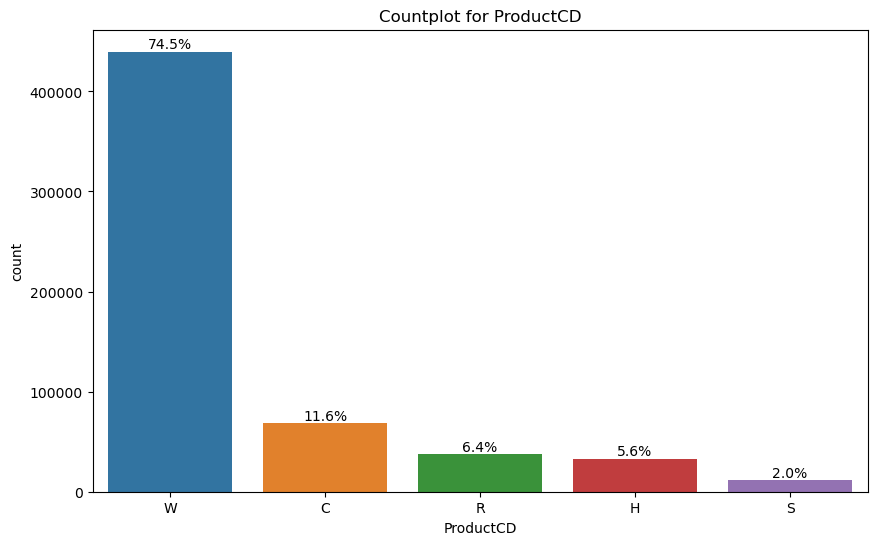

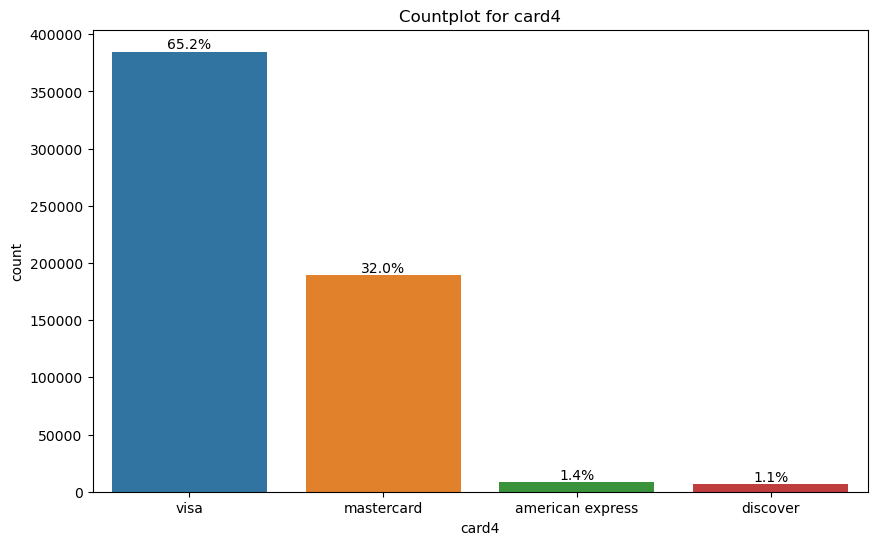

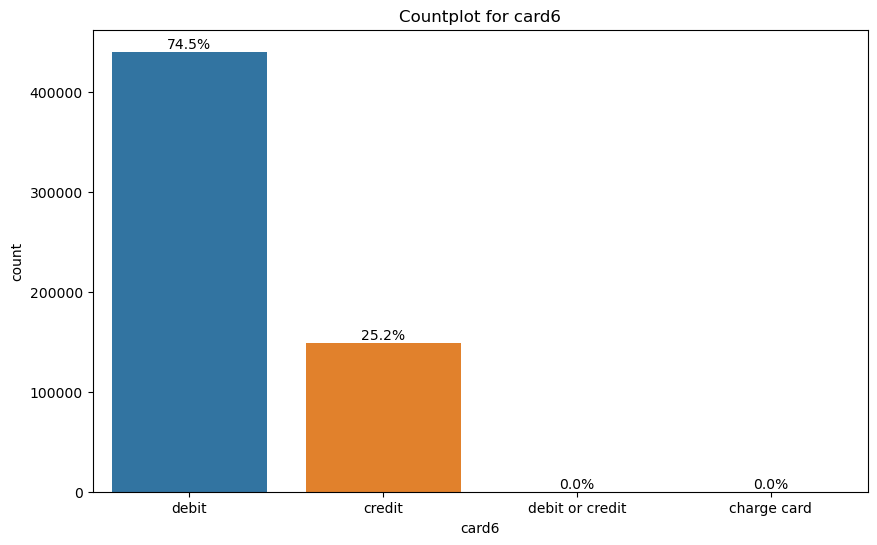

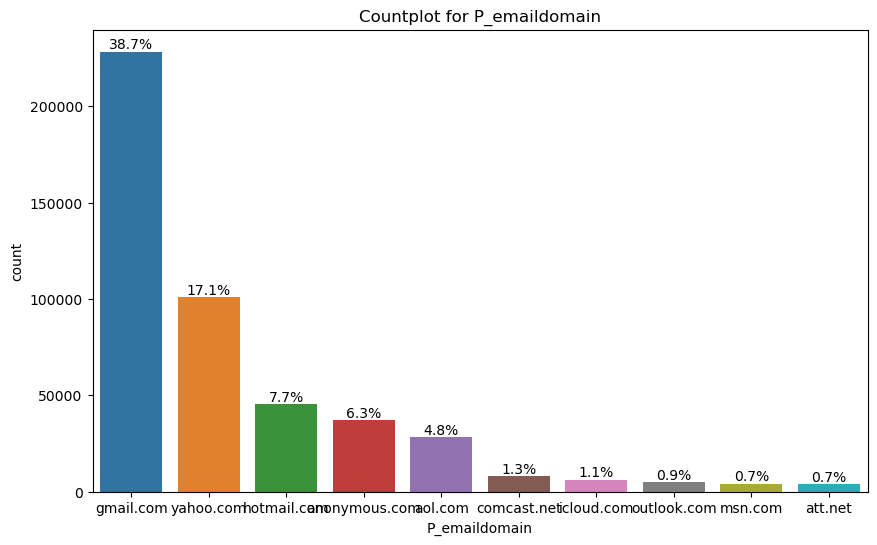

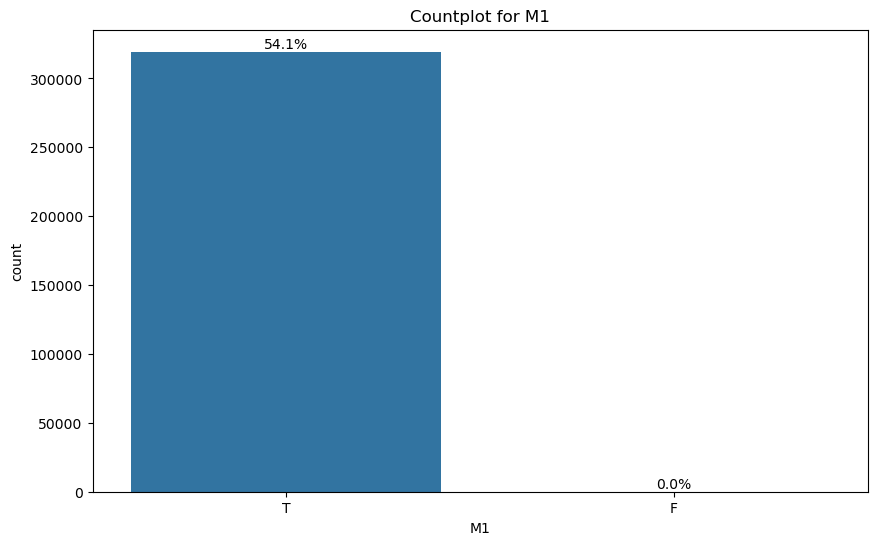

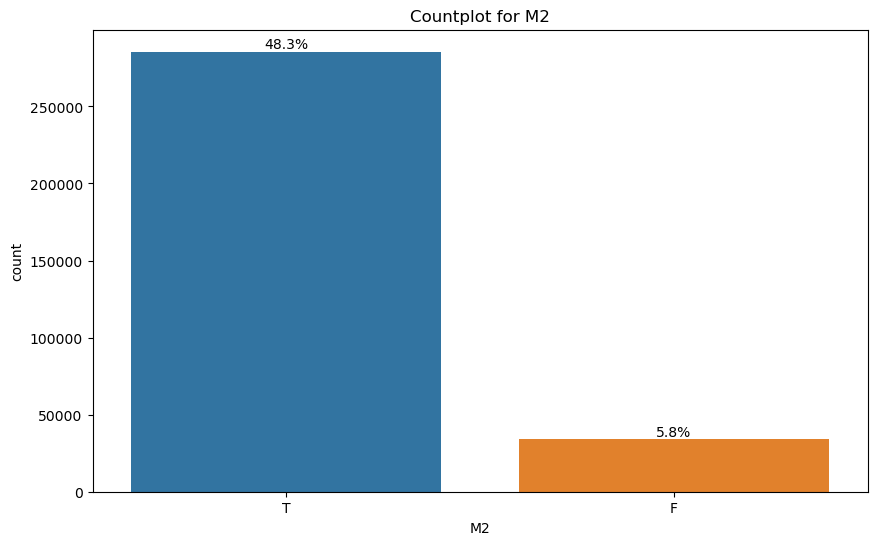

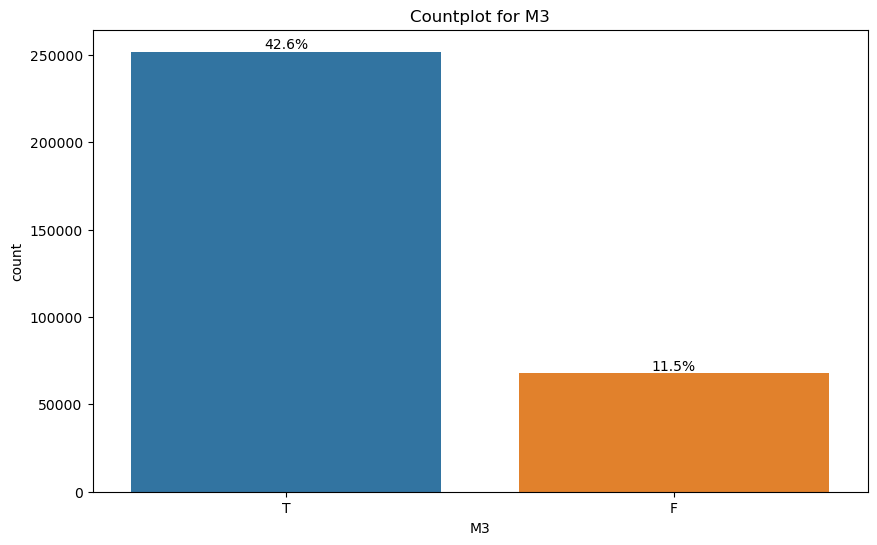

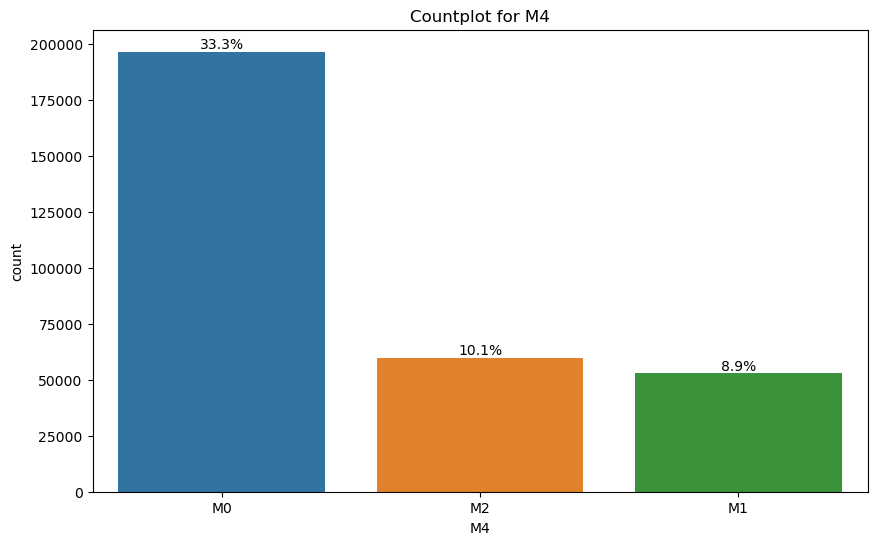

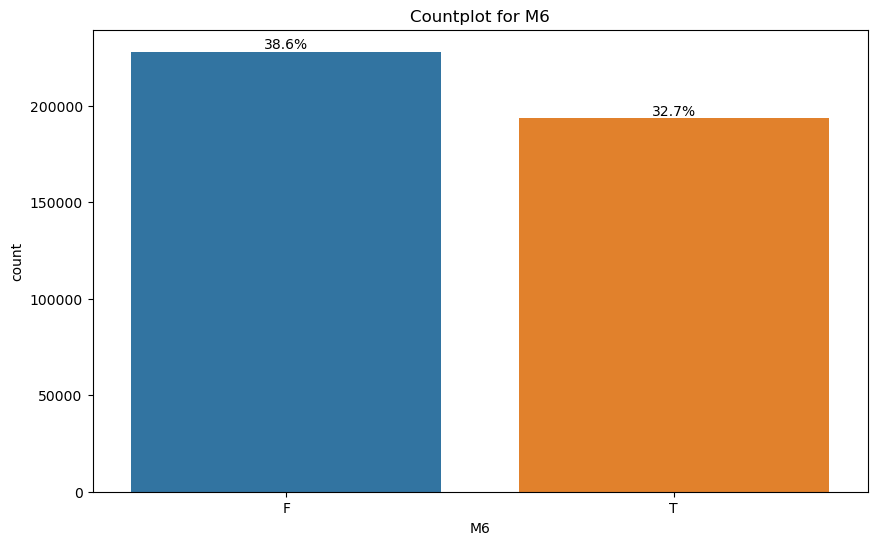

In [44]:
# Meloop melalui setiap kolom kategorikal
for col in categorical_cols:
    # Menghitung frekuensi nilai pada kolom
    value_counts = df_train[col].value_counts().sort_values(ascending=False)
    
    # Mengambil 10 data teratas
    top_10_values = value_counts.head(10)
    
    # Menampilkan countplot untuk 10 data teratas
    plt.figure(figsize=(10, 6))
    sns.countplot(x=col, data=df_train, order=top_10_values.index)
    plt.title(f'Countplot for {col}')
    
    # Menambahkan label persentase pada setiap bar
    total = len(df_train[col])
    for p in plt.gca().patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        plt.gca().annotate(percentage, (x, y), ha='center', va='bottom')
    
    plt.show()

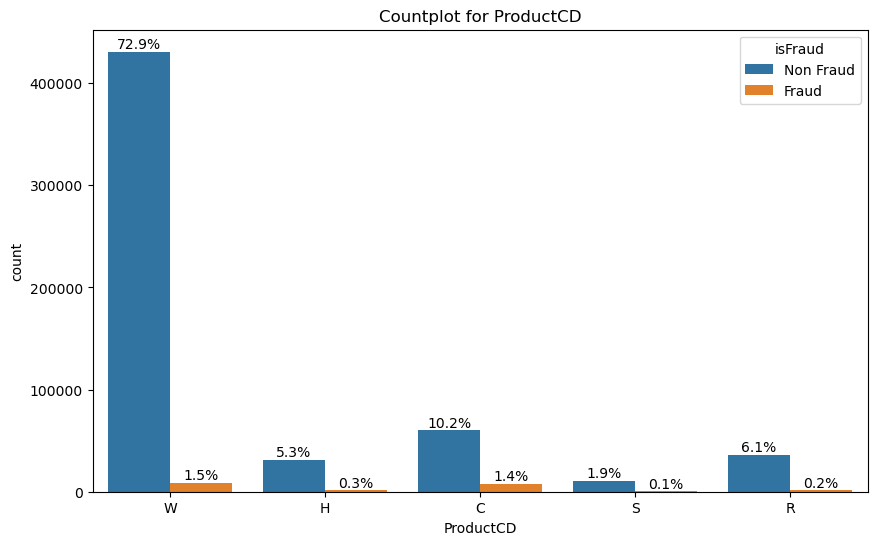

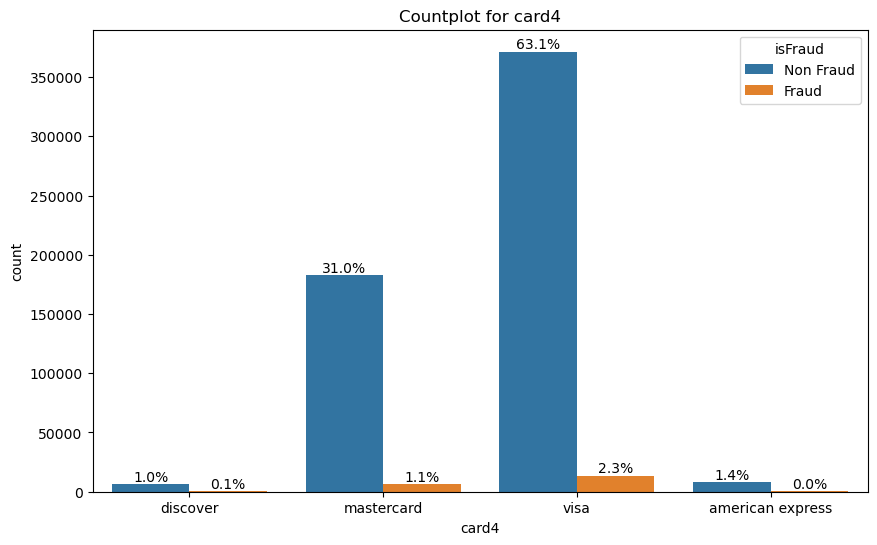

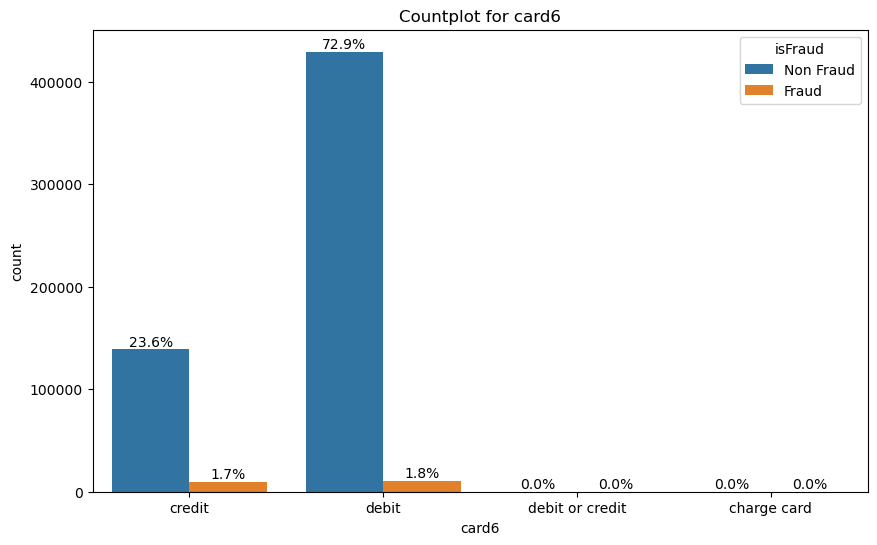

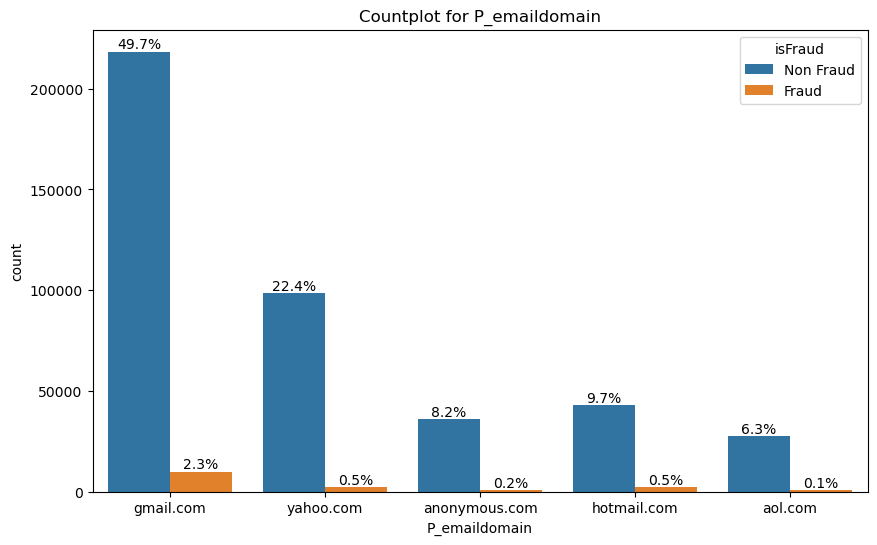

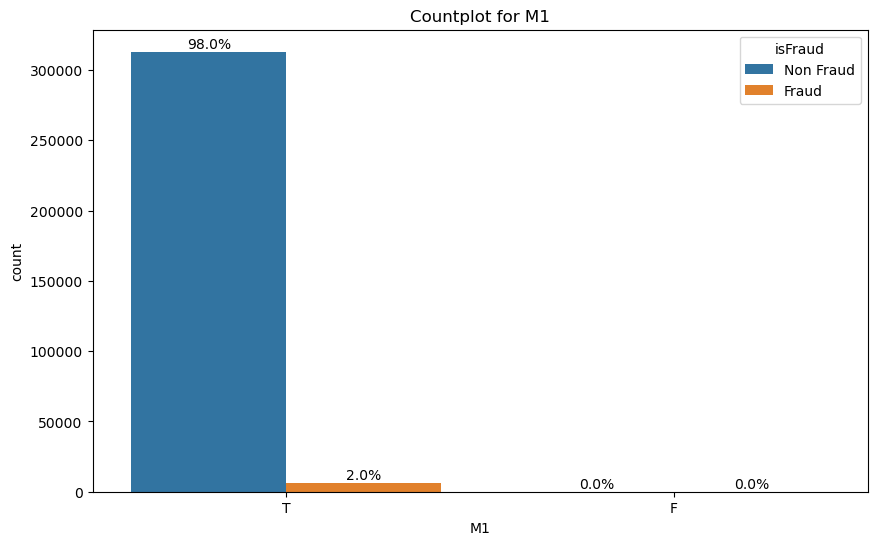

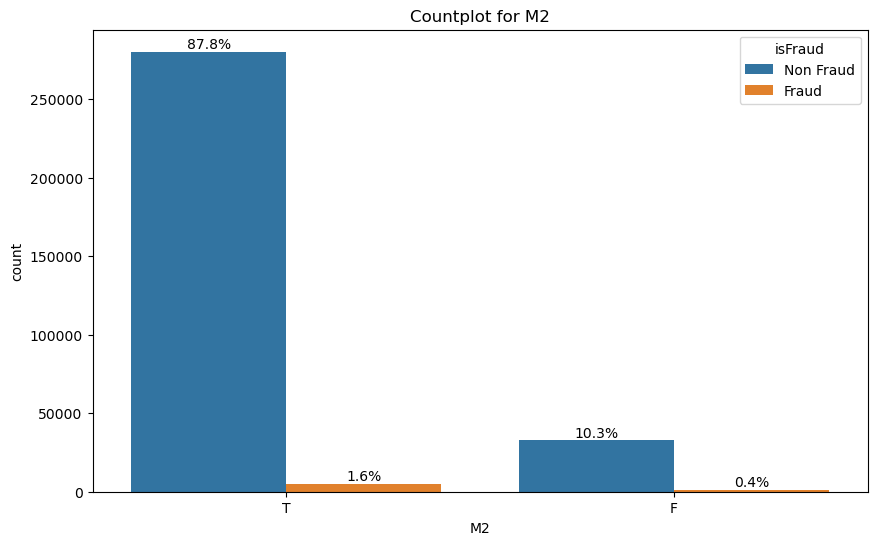

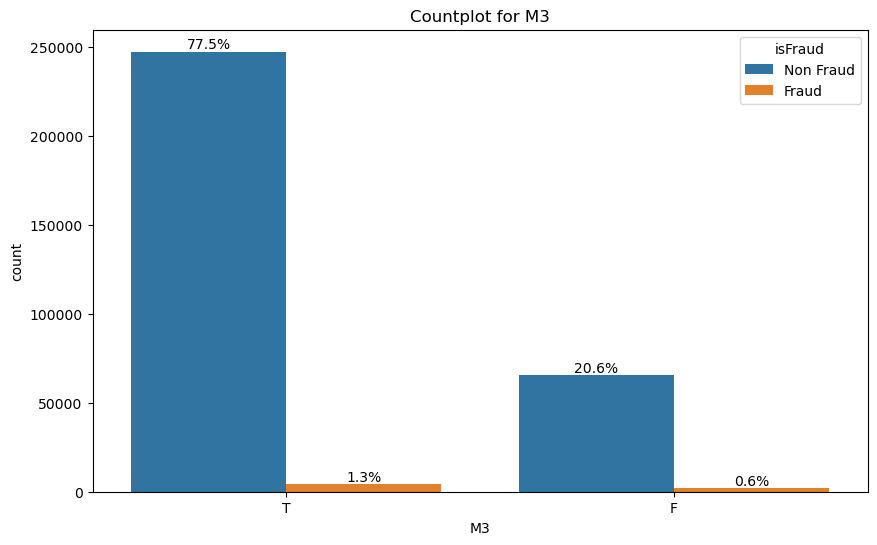

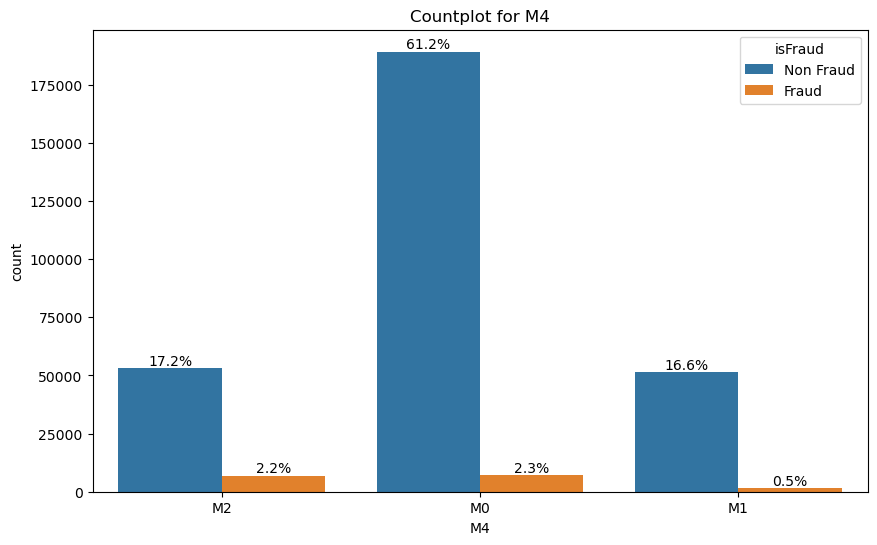

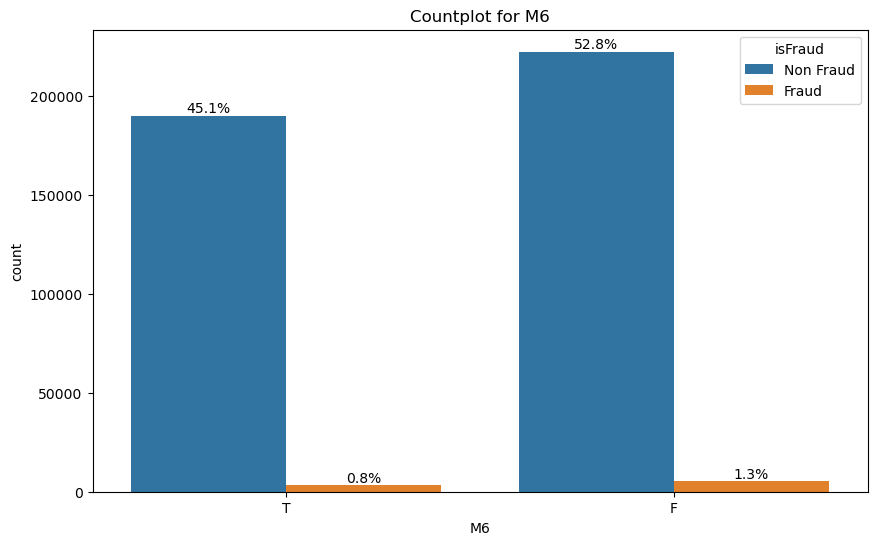

In [43]:
# Meloop melalui setiap kolom kategorikal
for col in categorical_cols:
    # Menghitung frekuensi nilai pada kolom
    value_counts = df_train[col].value_counts().sort_values(ascending=False)
    
    # Mengambil 5 kategori teratas
    top_10_categories = value_counts.head(5).index
    
    # Membuat subset data hanya dengan kategori teratas
    subset_data = df_train[df_train[col].isin(top_10_categories)]
    
    # Membuat countplot berdasarkan kolom isFraud
    plt.figure(figsize=(10, 6))
    sns.countplot(x=col, hue="isFraud", data=subset_data)
    plt.title(f'Countplot for {col}')
    plt.legend(title="isFraud", labels=["Non Fraud", "Fraud"])
    
    # Menambahkan label persentase di atas setiap bar
    total = len(subset_data)
    for p in plt.gca().patches:
        percentage = '{:.1f}%'.format(100 * p.get_height() / total)
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        plt.gca().annotate(percentage, (x, y), ha='center', va='bottom')
    
    plt.show()


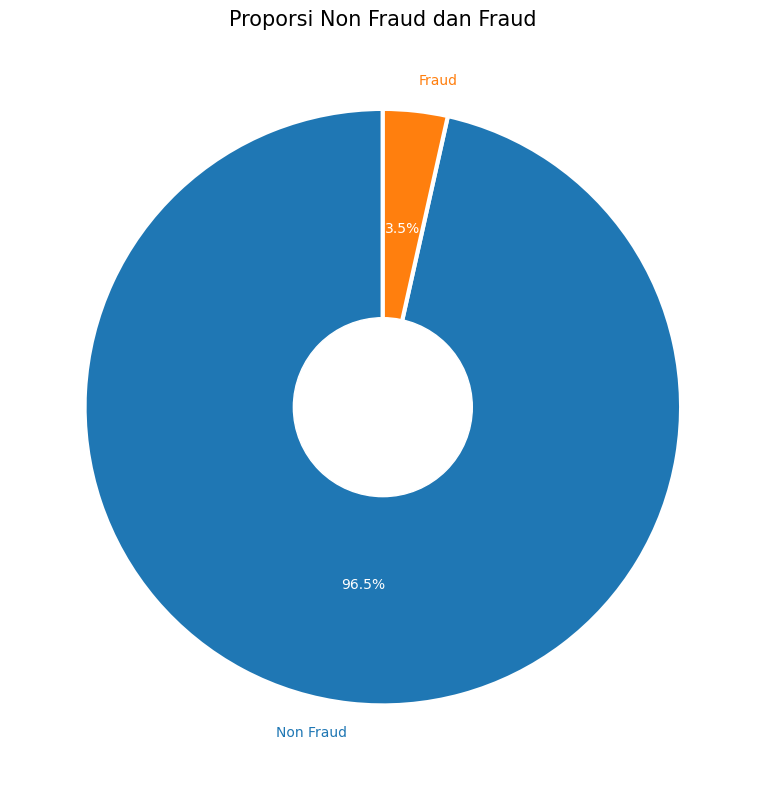

In [45]:
# Menghitung jumlah data Non Fraud dan Fraud
proporsi_fraud = df_train.groupby("isFraud")["card1"].count().reset_index()
proporsi_fraud.rename(columns = {"card1":"count"}, inplace=True)

# Menyimpan nilai kategori Non Fraud dan Fraud
fraud_user = proporsi_fraud["isFraud"].map({0: "Non Fraud", 1: "Fraud"})
count_fraud_user = proporsi_fraud["count"]

# Melakukan visualisasi data dengan menggunakan doughnut chart
fig, ax = plt.subplots(figsize=(10, 8))

# Membuat doughnut chart dengan menggunakan pie plot
patches, texts, pcts = ax.pie(
    count_fraud_user, labels=fraud_user, autopct='%.1f%%',
    wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
    textprops={'size': 'medium'},
    startangle=90)

# Mengatur warna teks sesuai dengan warna setiap slice
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())

# Membuat lingkaran di tengah doughnut chart
central_circle = plt.Circle((0, 0), 0.3, color='white')
fig = plt.gcf()
fig.gca().add_artist(central_circle)

# Mengatur warna persentase teks menjadi putih
plt.setp(pcts, color='white')
# Mengatur teks dengan fontweight 100
plt.setp(texts, fontweight=100)

# Memberikan judul pada doughnut chart
ax.set_title('Proporsi Non Fraud dan Fraud', fontsize=15)

# Menyesuaikan tata letak plot
plt.tight_layout()

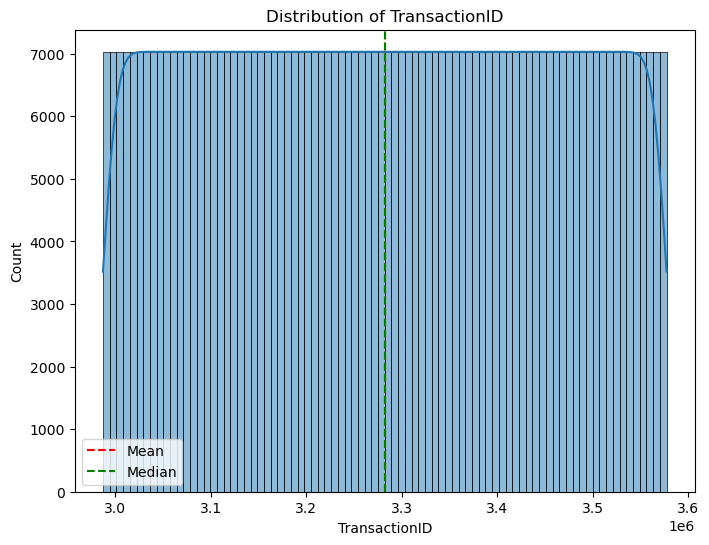

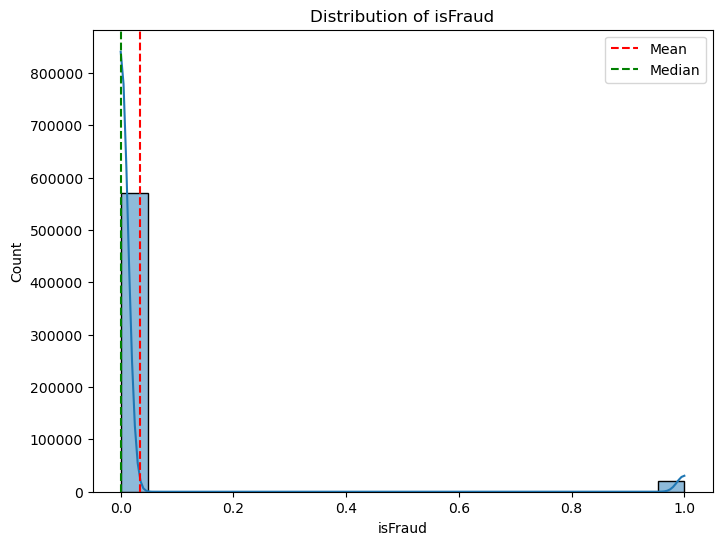

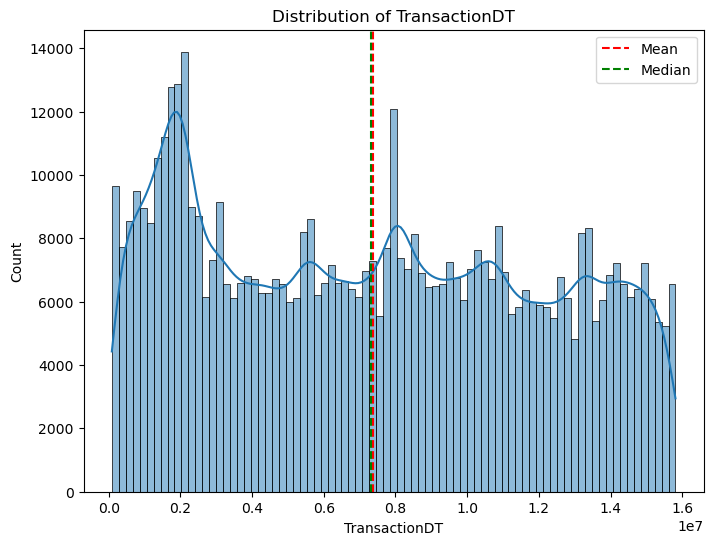

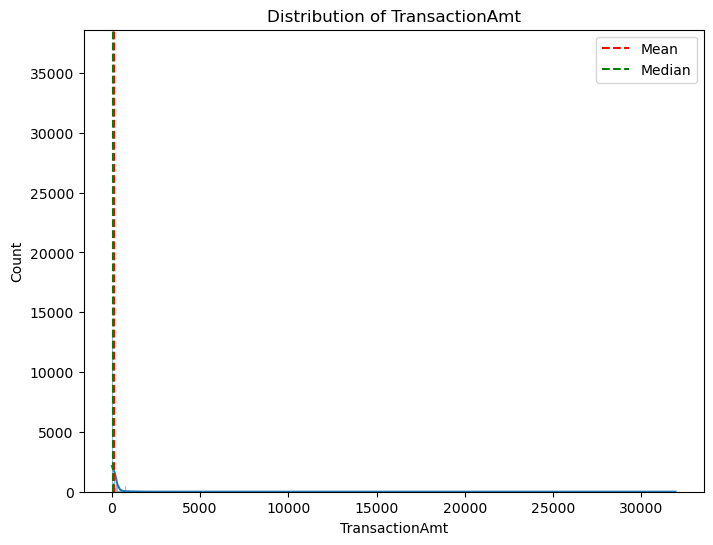

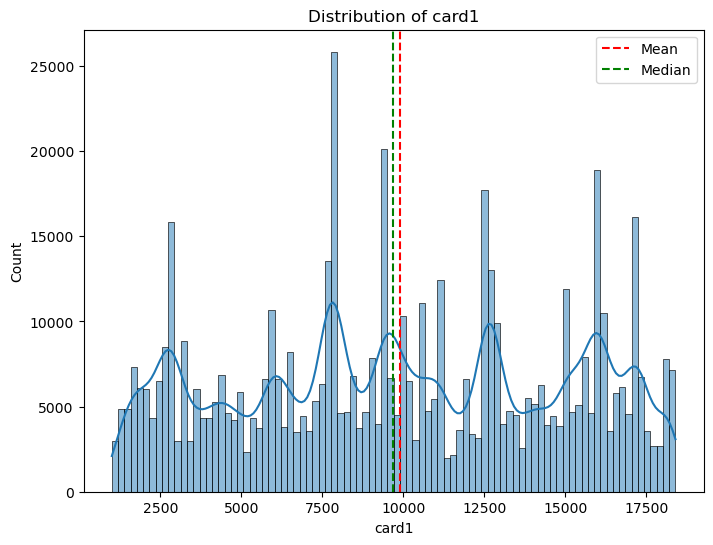

...

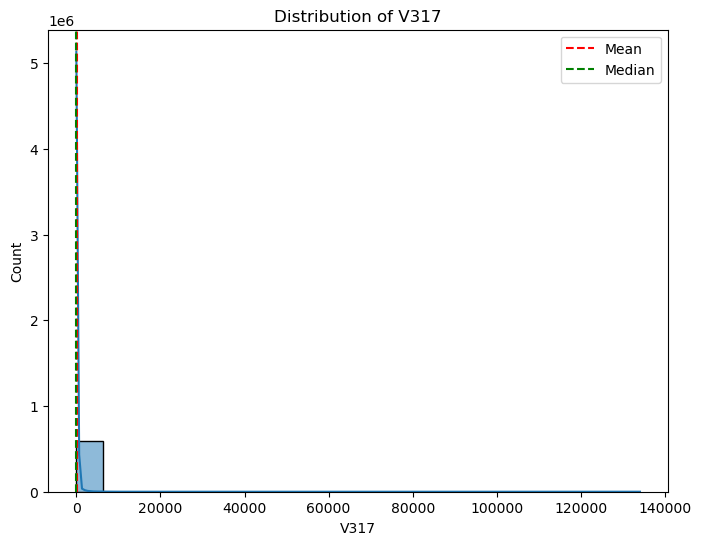

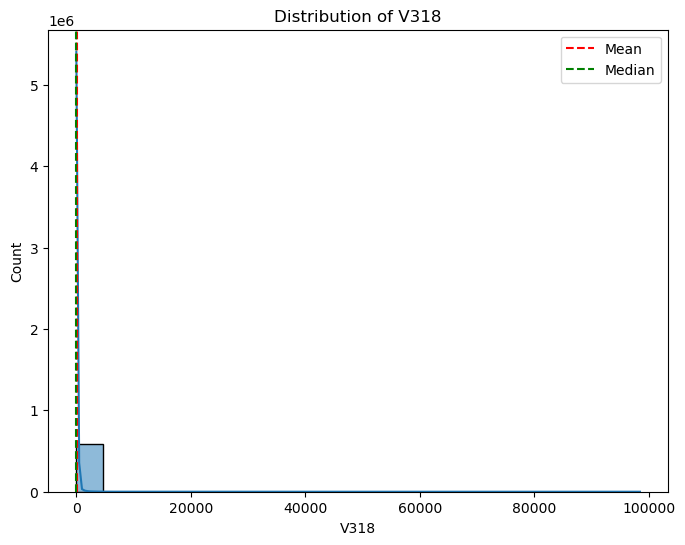

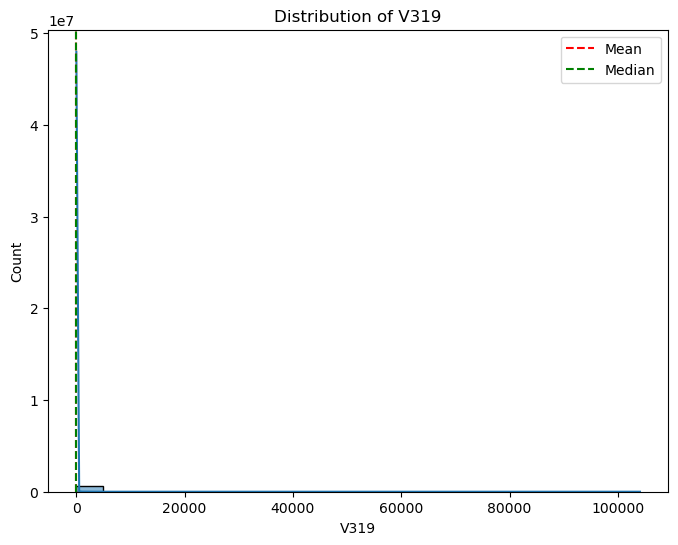

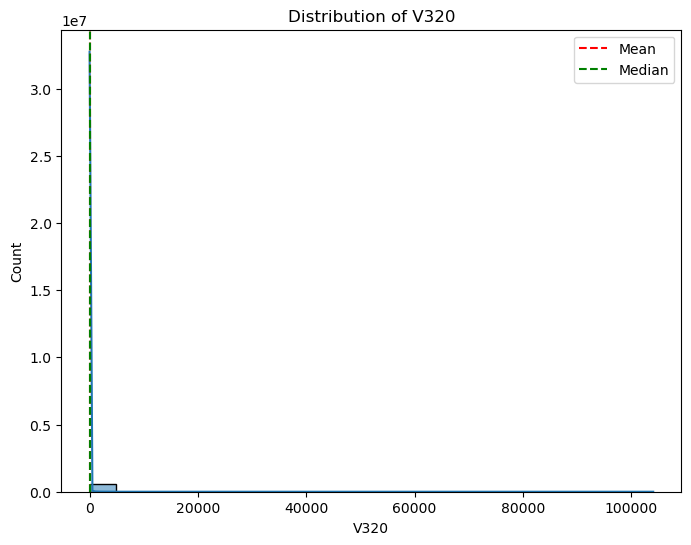

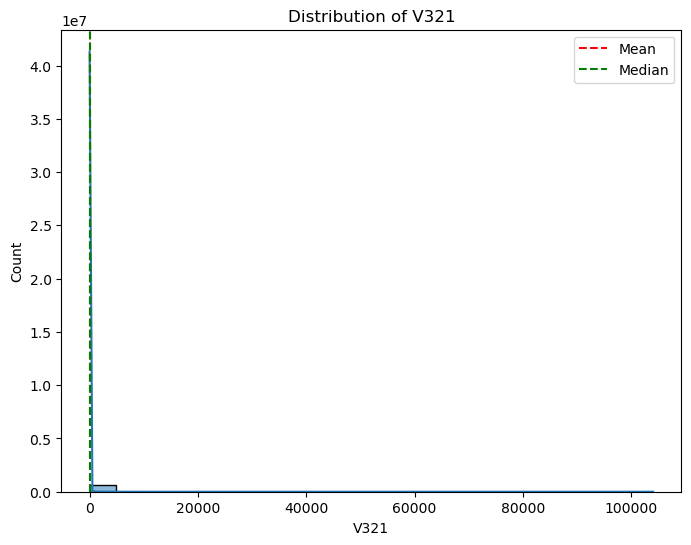

In [45]:
# Mengambil kolom-kolom numerik saja
numeric_cols = df_train.select_dtypes(include='number').columns

# Meloop melalui setiap kolom numerik
for col in numeric_cols:
    # Menampilkan distribusi data menggunakan histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df_train, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')

    # Menambahkan garis vertikal untuk menunjukkan rata-rata
    mean_val = df_train[col].mean()
    plt.axvline(mean_val, color='red', linestyle='--', label='Mean')

    # Menambahkan garis vertikal untuk menunjukkan median
    median_val = df_train[col].median()
    plt.axvline(median_val, color='green', linestyle='--', label='Median')

    plt.legend()
    plt.show()

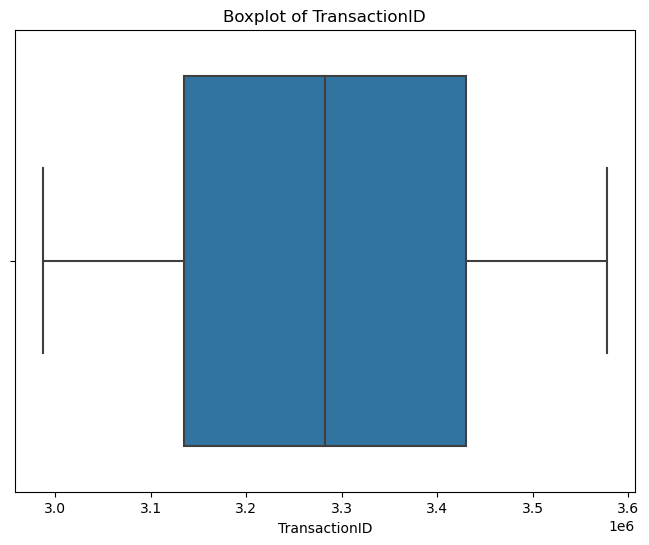

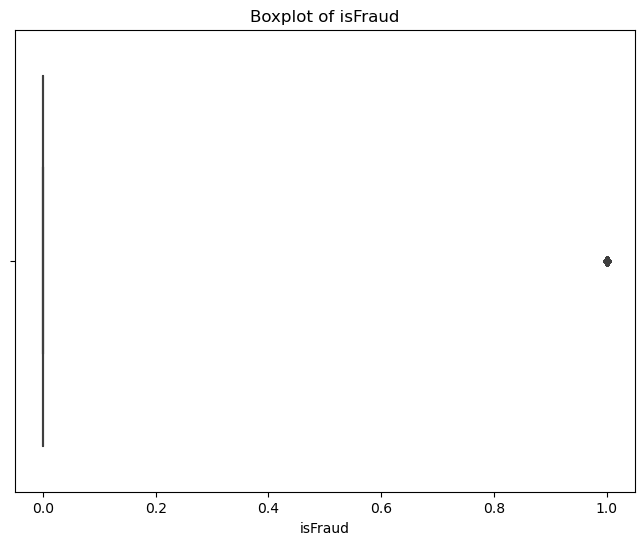

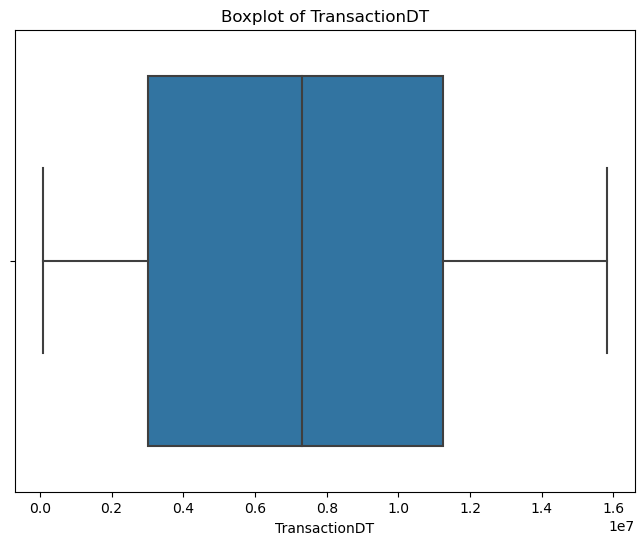

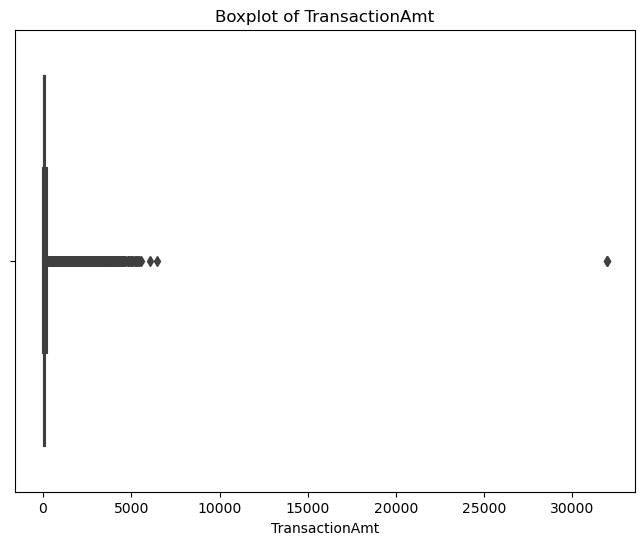

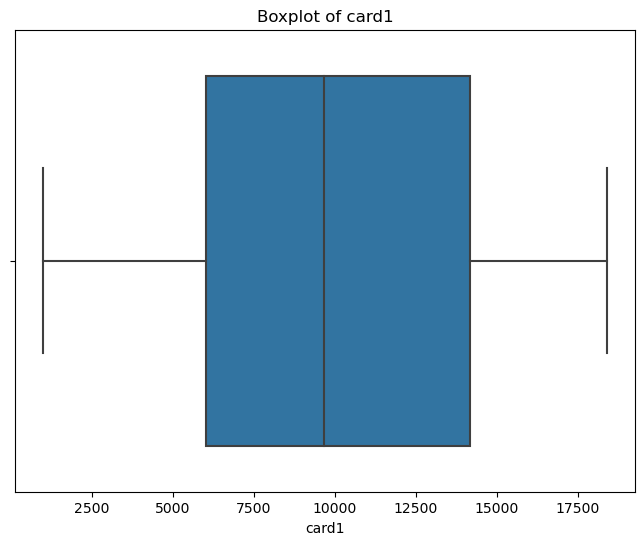

...

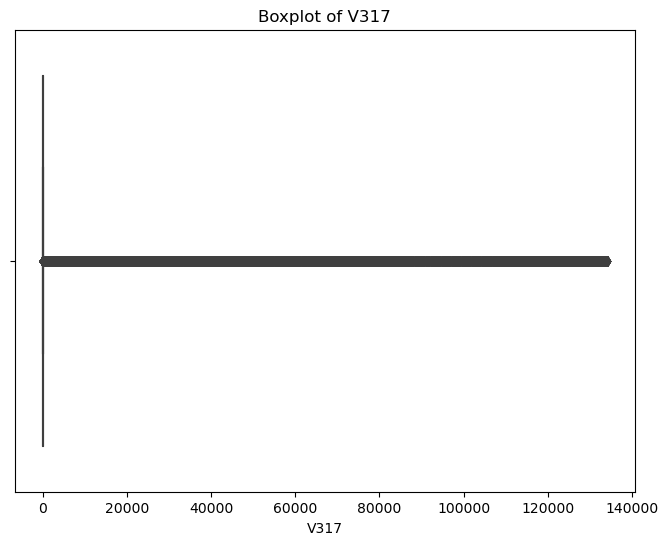

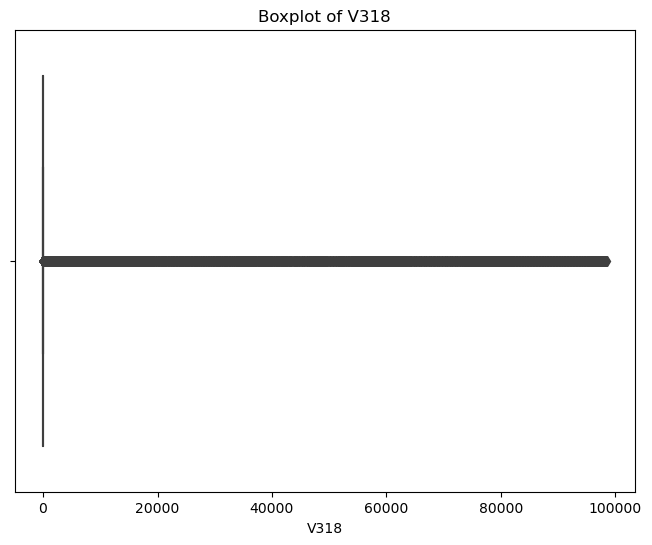

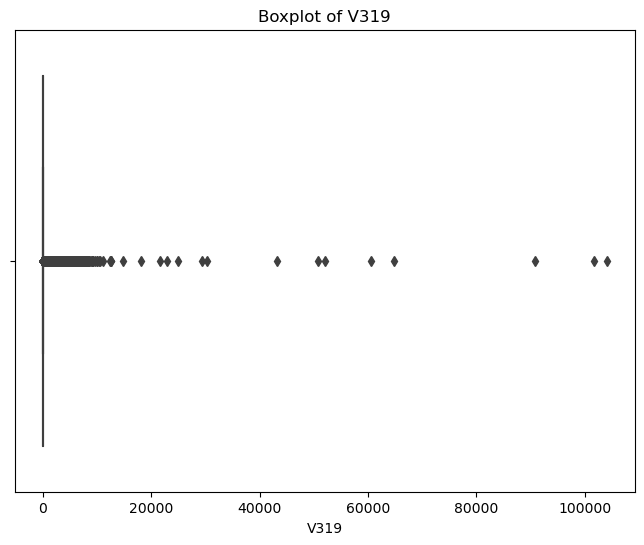

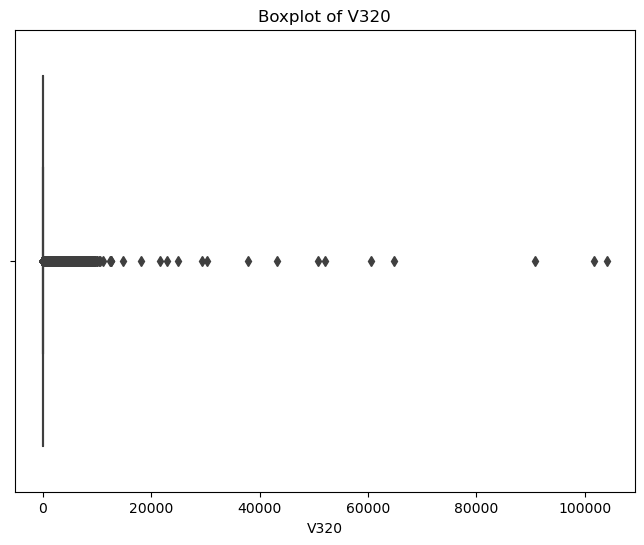

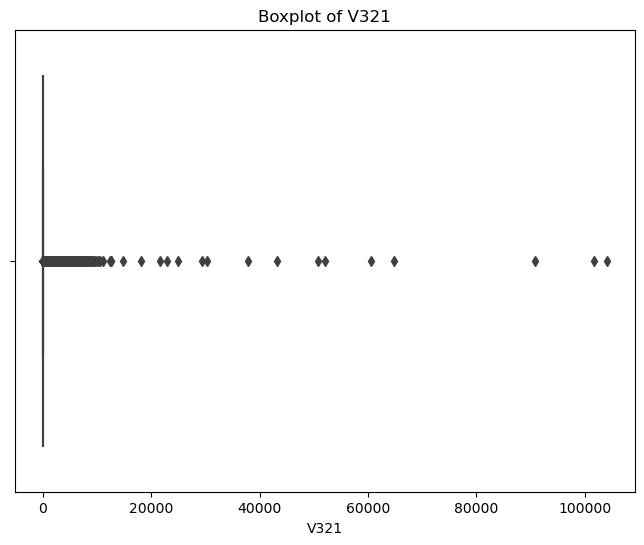

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Mengambil kolom-kolom numerik saja
numeric_cols = df_train.select_dtypes(include='number').columns

# Meloop melalui setiap kolom numerik
for col in numeric_cols:
    # Menampilkan distribusi data menggunakan boxplot
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df_train, x=col)
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.show()

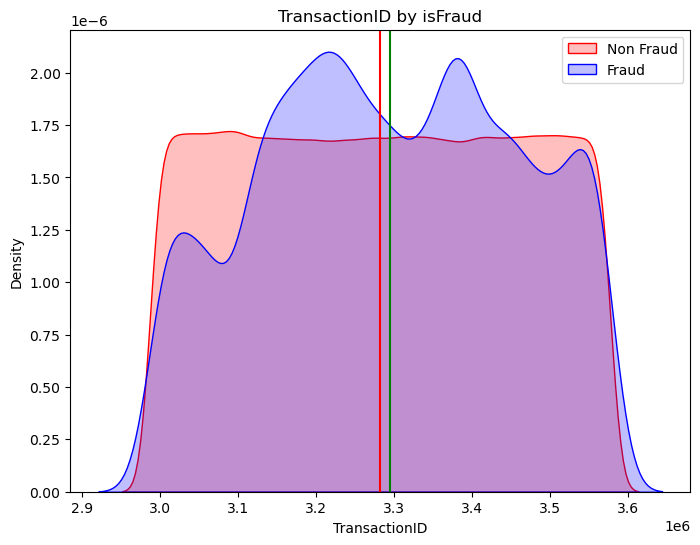

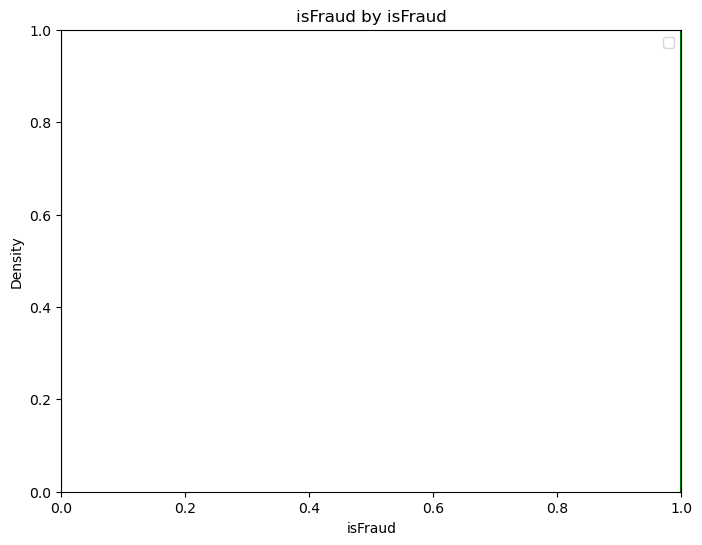

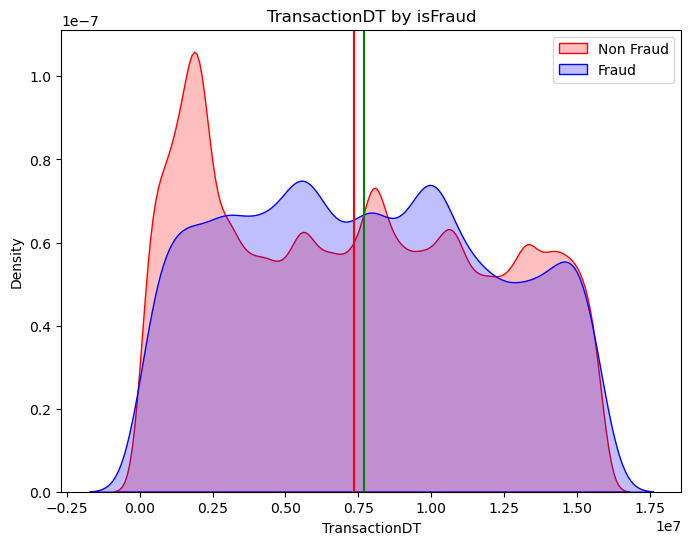

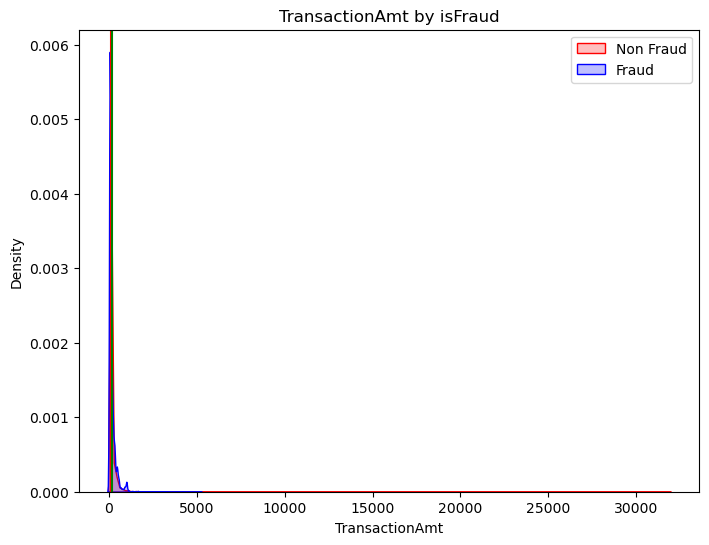

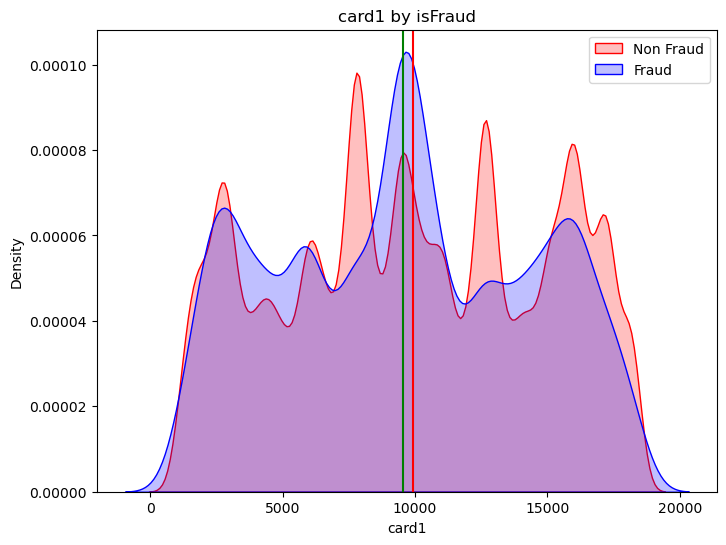

...

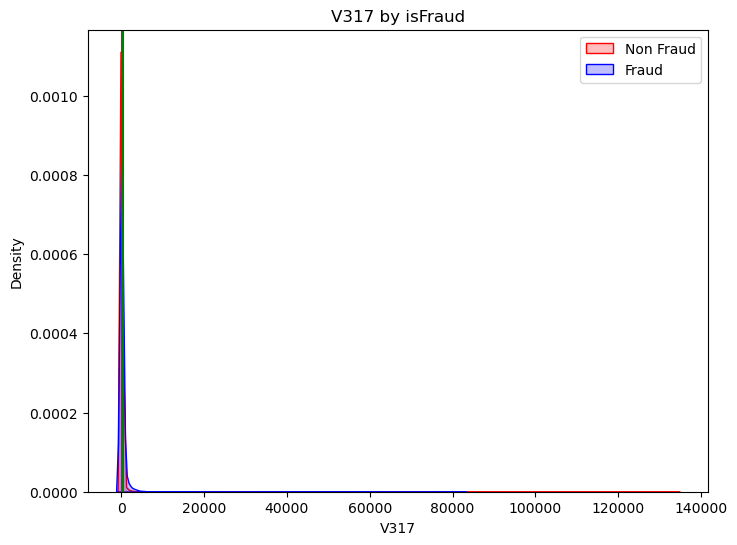

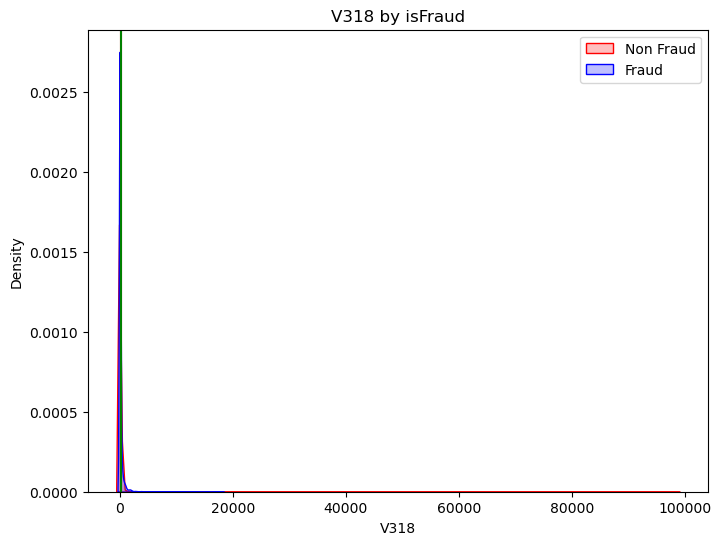

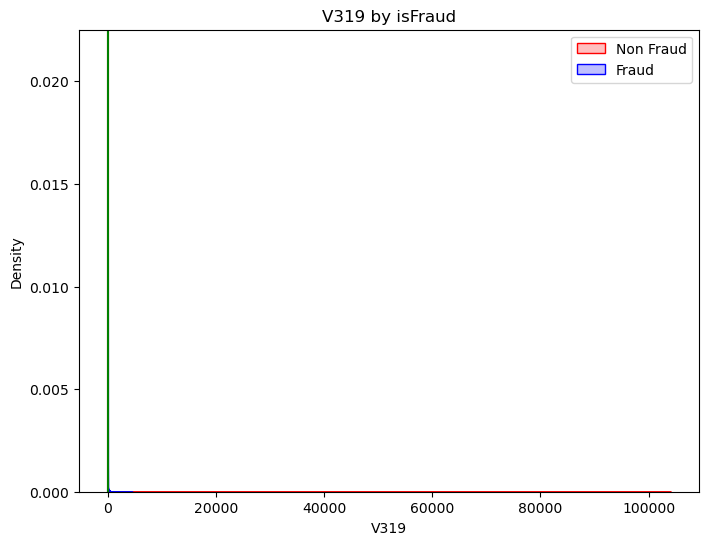

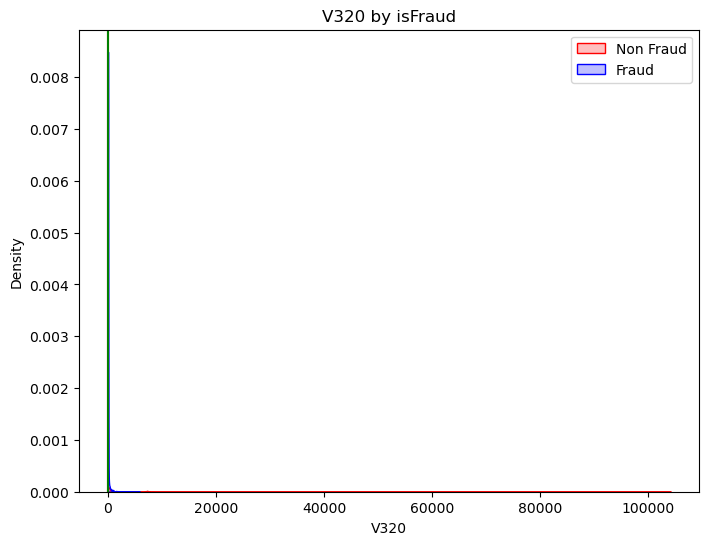

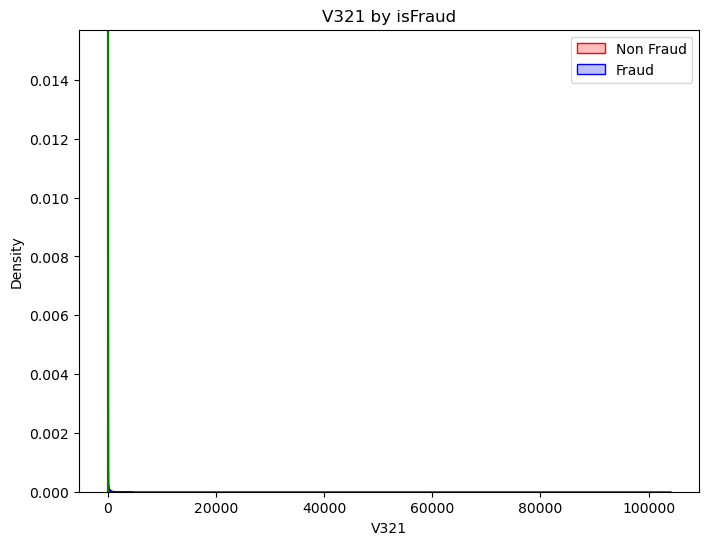

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt

# Mengambil kolom-kolom numerik saja
numeric_cols = df_train.select_dtypes(include='number').columns

# Meloop melalui setiap kolom numerik
for col in numeric_cols:
    # Membuat plot KDE untuk nilai Non Fraud
    plt.figure(figsize=(8, 6))
    stay_kde = sns.kdeplot(df_train[col][(df_train["isFraud"] == 0)], color="Red", shade=True)
    
    # Membuat plot KDE untuk nilai Fraud
    exit_kde = sns.kdeplot(df_train[col][(df_train["isFraud"] == 1)], ax=stay_kde, color="Blue", shade=True)
    
    # Menambahkan legenda
    exit_kde.legend(["Non Fraud", "Fraud"], loc='upper right')
    
    # Mengatur label sumbu y
    exit_kde.set_ylabel('Density')
    
    # Mengatur label sumbu x
    exit_kde.set_xlabel(col)
    
    # Mengatur judul plot
    exit_kde.set_title(f'{col} by isFraud')
    
    # Menambahkan garis vertikal untuk menunjukkan rata-rata Non Fraud
    stay_mean = df_train[col][df_train["isFraud"] == 0].mean()
    plt.axvline(stay_mean, 0, 1, color="r")
    
    # Menambahkan garis vertikal untuk menunjukkan rata-rata Fraud
    exit_mean = df_train[col][df_train["isFraud"] == 1].mean()
    plt.axvline(exit_mean, 0, 1, color="b")
    
    plt.show()

## Kesimpulan

1. Data yang tidak diperuntukan untuk pemodelan dan eda akan  langsung di drop pada data preparation yakni kolom 

* ['dist1', 'dist2', 'R_emaildomain', 'D5', 'D6', 'D7', 'D8', 'D9', 'D12', 'D13', 'D14', 'M5', 'M7', 'M8', 'M9', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339', 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11', 'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo']


2. Imputasi Data 

* Kolom Numerik

Rules :

* jika kolom mendapati skewnya sebesar > +- 0.5, maka dari itu kolom tersebut akan diimputasi dengan median
* jika kolom mendapati skewnya sebesar <= +- 0.5 kolom lainnya akan diimputasi dengan mean

Kolom dengan skewness di atas 0.5: ['isFraud', 'TransactionAmt', 'card3', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15', 'V2', 'V3', 'V6', 'V7', 'V8', 'V9', 'V11', 'V15', 'V16', 'V17', 'V18', 'V21', 'V22', 'V23', 'V24', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V37', 'V38', 'V39', 'V40', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V62', 'V63', 'V64', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V77', 'V78', 'V79', 'V80', 'V81', 'V83', 'V84', 'V85', 'V86', 'V87', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']

Kolom dengan skewness di bawah 0.5: ['card1', 'card2', 'card5', 'addr1', 'addr2', 'V1', 'V4', 'V5', 'V10', 'V12', 'V13', 'V14', 'V19', 'V20', 'V25', 'V35', 'V36', 'V41', 'V53', 'V54', 'V61', 'V65', 'V66', 'V75', 'V76', 'V82', 'V88', 'V107']

* Kolom Kategorik

Sementara akan menggunakan imputasi menggunakan kata "kosong"

3. EDA Kolom Kategorikal menggunakan countplot

Countplot untuk keseluruhan data tanpa melihat kelas non fraud dan fraud

* Frekuensi Transaksi pada ProductCD tertinggi yakni produk W 74.5%, selanjutnya C 11.6%, R 6.4%, H 5.6% dan S 2.5%
* Frekuensi Transaksi pada card4 tertinggi yakni produk visa 65.2%, selanjutnya mastercard 32.0%, american express 1.4%, dan discover 1.1%
* Frekuensi Transaksi pada card6 tertinggi yakni produk debit 74.5%, selanjutnya credit 25.2%, dan debit credit serta charge card yang masing masing sebesar 0%
* Frekuensi Transaksi pada P_emaildomain tertinggi yakni gmail.com 38.7%, yahoo.com 17.7% hotmail.com 7.7% anonymous.com 6.3% aol.com 4.%  

Countplot berdasarkan kelas non fraud dan fraud

* Secara umum, seluruh kelas non fraud jauh lebih mendominasi untuk masing masing kolom kategorik yang akan diekplorasi dibandingkan dengan kelas fraud
* Frekuensi Transaksi ProductCD pada kelas fraud tertinggi diawali dengan produk W sebesar 1.5%, C sebesar 1.4%, H sebesar 0.3%, R sebesar 0.2% dan S sebesar 0.1%
* Frekuensi Transaksi card4 pada kelas fraud tertinggi diawali dengan produk visa sebesar 2.3%, mastercard sebesar 1.1%, discover sebesar 0.1% dan american express sebesar 0.0% 
* Frekuensi Transaksi card6 pada kelas fraud tertinggi diawali dengan produk debit sebesar 1.8%, credit sebesar 1.7%, debit or credit sebesar 0.0% dan charge card sebesar 0.0% 
* Frekuensi Transaksi menggunakan email atau P_emaildomain pada kelas fraud tertinggi diawali dengan gmail.com sebesar 2.3%, hotmail.com sebesar 0.5%, yahoo.com sebesar 0.5%, anonymous.com sebesar 0.2%, dan aol.com sebesar 0.1% 

4. Data Imbalance, maka perlu dilakukan balancing data untuk menyeimbangkan label target yakni 96.5% untuk fraud dan 3.5% untuk fraud

5. Outlier Detection, memang terdapat titik yang menggambarkan oulier, namun data tersebut dibutuhkan untuk proses deteksi fraud

# Data Preprocessing

## Handling Missing Value

In [45]:
from sklearn.impute import SimpleImputer

def imputeData(data, numerical_columns_mean, numerical_columns_median, categorical_columns):
    """
    Fungsi untuk melakukan imputasi data numerik dan kategorikal
    :param data: <pandas dataframe> sample data input
    :param numerical_columns_mean: <list> list kolom numerik data yang akan diimputasi dengan mean
    :param numerical_columns_median: <list> list kolom numerik data yang akan diimputasi dengan median
    :param categorical_columns: <list> list kolom kategorikal data
    :return numerical_data_imputed: <pandas dataframe> data numerik imputed
    :return categorical_data_imputed: <pandas dataframe> data kategorikal imputed
    """
    # Imputasi kolom numerik dengan mean
    numerical_data_mean = data[numerical_columns_mean]
    imputer_numerical_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
    imputer_numerical_mean.fit(numerical_data_mean)
    imputed_data_mean = imputer_numerical_mean.transform(numerical_data_mean)
    numerical_data_imputed_mean = pd.DataFrame(imputed_data_mean, columns=numerical_columns_mean, index=numerical_data_mean.index)

    # Imputasi kolom numerik dengan median
    numerical_data_median = data[numerical_columns_median]
    imputer_numerical_median = SimpleImputer(missing_values=np.nan, strategy='median')
    imputer_numerical_median.fit(numerical_data_median)
    imputed_data_median = imputer_numerical_median.transform(numerical_data_median)
    numerical_data_imputed_median = pd.DataFrame(imputed_data_median, columns=numerical_columns_median, index=numerical_data_median.index)

    # Gabungkan kedua data numerik yang telah diimputasi
    numerical_data_imputed = pd.concat([numerical_data_imputed_mean, numerical_data_imputed_median], axis=1)

    # Seleksi data kategorikal
    categorical_data = data[categorical_columns]

    # Lakukan imputasi untuk data kategorikal dengan kata "empty"
    categorical_data_imputed = categorical_data.fillna("empty")

    # Gabungkan data numerik dan kategorikal yang telah diimputasi
    data_imputed = pd.concat([numerical_data_imputed, categorical_data_imputed], axis=1)

    return data_imputed

## Parameter Imputasi 

In [46]:
#Imputasi Data
numerical_column =  ['TransactionAmt', 'card3', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15', 'V2', 'V3', 'V6', 'V7', 'V8', 'V9', 'V11', 'V15', 'V16', 'V17', 'V18', 'V21', 'V22', 'V23', 'V24', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V37', 'V38', 'V39', 'V40', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V62', 'V63', 'V64', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V77', 'V78', 'V79', 'V80', 'V81', 'V83', 'V84', 'V85', 'V86', 'V87', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']
numerical_column_mean = ['card1', 'card2', 'card5', 'addr1', 'addr2', 'V1', 'V4', 'V5', 'V10', 'V12', 'V13', 'V14', 'V19', 'V20', 'V25', 'V35', 'V36', 'V41', 'V53', 'V54', 'V61', 'V65', 'V66', 'V75', 'V76', 'V82', 'V88', 'V107']
set_numerik = numerical_column + numerical_column_mean
dataset_column = list(X_train.columns)
categorical_column = list(set(dataset_column).difference(set(set_numerik)))

## Imputasi Data Train

In [47]:
X_train_impute = imputeData(data = X_train, 
                            numerical_columns_mean = numerical_column_mean, 
                            numerical_columns_median = numerical_column, 
                            categorical_columns = categorical_column)

In [48]:
# Sanity Check Hasil Menghapus kolom dengan nilai null diatas 50%
for column in X_train_impute.columns:
    null_percentage = X_train_impute[column].isnull().mean() * 100
    print(f"Persentase nilai null pada kolom {column}: {null_percentage:.2f}%")

Persentase nilai null pada kolom card1: 0.00%
Persentase nilai null pada kolom card2: 0.00%
Persentase nilai null pada kolom card5: 0.00%
Persentase nilai null pada kolom addr1: 0.00%
Persentase nilai null pada kolom addr2: 0.00%
Persentase nilai null pada kolom V1: 0.00%
Persentase nilai null pada kolom V4: 0.00%
Persentase nilai null pada kolom V5: 0.00%
Persentase nilai null pada kolom V10: 0.00%
Persentase nilai null pada kolom V12: 0.00%
Persentase nilai null pada kolom V13: 0.00%
Persentase nilai null pada kolom V14: 0.00%
Persentase nilai null pada kolom V19: 0.00%
Persentase nilai null pada kolom V20: 0.00%
Persentase nilai null pada kolom V25: 0.00%
Persentase nilai null pada kolom V35: 0.00%
Persentase nilai null pada kolom V36: 0.00%
Persentase nilai null pada kolom V41: 0.00%
Persentase nilai null pada kolom V53: 0.00%
Persentase nilai null pada kolom V54: 0.00%
Persentase nilai null pada kolom V61: 0.00%
Persentase nilai null pada kolom V65: 0.00%
Persentase nilai null pad

Persentase nilai null pada kolom M6: 0.00%
Persentase nilai null pada kolom card4: 0.00%
Persentase nilai null pada kolom M1: 0.00%
Persentase nilai null pada kolom ProductCD: 0.00%
Persentase nilai null pada kolom P_emaildomain: 0.00%
Persentase nilai null pada kolom M2: 0.00%
Persentase nilai null pada kolom card6: 0.00%
Persentase nilai null pada kolom M4: 0.00%


## Imputasi Data Valid

In [49]:
X_valid_impute = imputeData(data = X_valid, 
                            numerical_columns_mean = numerical_column_mean, 
                            numerical_columns_median = numerical_column, 
                            categorical_columns = categorical_column)

In [50]:
# Sanity Check Hasil Menghapus kolom dengan nilai null diatas 50%
for column in X_valid_impute.columns:
    null_percentage = X_valid_impute[column].isnull().mean() * 100
    print(f"Persentase nilai null pada kolom {column}: {null_percentage:.2f}%")

Persentase nilai null pada kolom card1: 0.00%
Persentase nilai null pada kolom card2: 0.00%
Persentase nilai null pada kolom card5: 0.00%
Persentase nilai null pada kolom addr1: 0.00%
Persentase nilai null pada kolom addr2: 0.00%
Persentase nilai null pada kolom V1: 0.00%
Persentase nilai null pada kolom V4: 0.00%
Persentase nilai null pada kolom V5: 0.00%
Persentase nilai null pada kolom V10: 0.00%
Persentase nilai null pada kolom V12: 0.00%
Persentase nilai null pada kolom V13: 0.00%
Persentase nilai null pada kolom V14: 0.00%
Persentase nilai null pada kolom V19: 0.00%
Persentase nilai null pada kolom V20: 0.00%
Persentase nilai null pada kolom V25: 0.00%
Persentase nilai null pada kolom V35: 0.00%
Persentase nilai null pada kolom V36: 0.00%
Persentase nilai null pada kolom V41: 0.00%
Persentase nilai null pada kolom V53: 0.00%
Persentase nilai null pada kolom V54: 0.00%
Persentase nilai null pada kolom V61: 0.00%
Persentase nilai null pada kolom V65: 0.00%
Persentase nilai null pad

## Imputasi Data Test

In [51]:
X_test_impute = imputeData(data = X_test, 
                           numerical_columns_mean = numerical_column_mean, 
                           numerical_columns_median = numerical_column, 
                           categorical_columns = categorical_column)

In [52]:
# Sanity Check Hasil Menghapus kolom dengan nilai null diatas 50%
for column in X_valid_impute.columns:
    null_percentage = X_valid_impute[column].isnull().mean() * 100
    print(f"Persentase nilai null pada kolom {column}: {null_percentage:.2f}%")

Persentase nilai null pada kolom card1: 0.00%
Persentase nilai null pada kolom card2: 0.00%
Persentase nilai null pada kolom card5: 0.00%
Persentase nilai null pada kolom addr1: 0.00%
Persentase nilai null pada kolom addr2: 0.00%
Persentase nilai null pada kolom V1: 0.00%
Persentase nilai null pada kolom V4: 0.00%
Persentase nilai null pada kolom V5: 0.00%
Persentase nilai null pada kolom V10: 0.00%
Persentase nilai null pada kolom V12: 0.00%
Persentase nilai null pada kolom V13: 0.00%
Persentase nilai null pada kolom V14: 0.00%
Persentase nilai null pada kolom V19: 0.00%
Persentase nilai null pada kolom V20: 0.00%
Persentase nilai null pada kolom V25: 0.00%
Persentase nilai null pada kolom V35: 0.00%
Persentase nilai null pada kolom V36: 0.00%
Persentase nilai null pada kolom V41: 0.00%
Persentase nilai null pada kolom V53: 0.00%
Persentase nilai null pada kolom V54: 0.00%
Persentase nilai null pada kolom V61: 0.00%
Persentase nilai null pada kolom V65: 0.00%
Persentase nilai null pad

Persentase nilai null pada kolom M4: 0.00%


## Get Dummies

In [53]:
def get_dummies(train_df, input_df):
    # Menggabungkan data train dan input menjadi satu DataFrame
    combined_df = pd.concat([train_df, input_df])
    
    # Mengubah variabel kategorikal menjadi variabel dummy
    dummies_df = pd.get_dummies(combined_df, columns=train_df.select_dtypes(include='object').columns)
    
    # Memisahkan kembali data train dan input
    train_dummies = dummies_df[:train_df.shape[0]]
    input_dummies = dummies_df[train_df.shape[0]:]
    
    return train_dummies, input_dummies

In [54]:
dataset_ohe, valid_set = get_dummies(X_train_impute, X_valid_impute)

In [55]:
dataset, test_set = get_dummies(X_train_impute, X_test_impute)

## Balancing Label

In [56]:
#Import library untuk data preparation dan visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# import warnings for ignore the warnings
import warnings 
warnings.filterwarnings("ignore")

# import pickle and json file for columns and model file
import pickle
import json
import joblib
import yaml
import scipy.stats as scs

#Import package untuk balancing dataset
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pickle
import os

### SMOTE

In [57]:
def sm_fit_resample(set_data: pd.DataFrame) -> pd.DataFrame:
    # Create copy of set data
    set_data = set_data.copy()

    # Create sampling object
    sm = SMOTE(random_state = 112)

    # Balancing set data
    X_sm, y_sm = sm.fit_resample(
        set_data.drop("isFraud", axis = 1),
        set_data.isFraud
    )

    # Concatenate balanced data
    set_data_sm = pd.concat(
        [X_sm, y_sm],
        axis = 1
    )

    # Return balanced data
    return set_data_sm

In [58]:
dataset_full = pd.concat([dataset, y_train],axis = 1)

In [59]:
dataset_full.head()

,card1,card2,card5,addr1,addr2,V1,V4,V5,V10,V12,V13,V14,V19,V20,V25,V35,V36,V41,V53,V54,V61,V65,V66,V75,V76,V82,V88,V107,TransactionAmt,card3,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D10,D11,D15,V2,V3,V6,V7,V8,V9,V11,V15,V16,V17,V18,V21,V22,V23,V24,V26,V27,V28,V29,V30,V31,V32,V33,V34,V37,V38,V39,V40,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V55,V56,V57,V58,V59,V60,V62,V63,V64,V67,V68,V69,V70,V71,V72,V73,V74,V77,V78,V79,V80,V81,V83,V84,V85,...,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,M3_F,M3_T,M3_empty,M6_F,M6_T,M6_empty,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,M1_F,M1_T,M1_empty,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,M2_F,M2_T,M2_empty,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty,M4_M0,M4_M1,M4_M2,M4_empty,isFraud
378585,6470.0,111.0,226.0,299.0,87.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.00000,0.000000,1.000000,0.0,0.0,1.0,1.0,1.0,0.000000,0.00000,2.000000,1.000000,1.0,59.00,150.0,5.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,3.0,62.0,0.0,1.0,62.0,62.0,42.0,62.0,1.0,2.0,1.0,2.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,102.000000,102.000000,102.000000,102.0,102.000000,0.0,102.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0
85054,7826.0,481.0,224.0,184.0,87.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.00000,1.000000,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000,1.00000,0.000000,1.000000,1.0,39.00,150.0,5.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,98.0,8.0,5.0,0.0,117.0,117.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0

In [60]:
dataset_smote = sm_fit_resample(dataset_full)

In [61]:
dataset_smote.head()

,card1,card2,card5,addr1,addr2,V1,V4,V5,V10,V12,V13,V14,V19,V20,V25,V35,V36,V41,V53,V54,V61,V65,V66,V75,V76,V82,V88,V107,TransactionAmt,card3,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D10,D11,D15,V2,V3,V6,V7,V8,V9,V11,V15,V16,V17,V18,V21,V22,V23,V24,V26,V27,V28,V29,V30,V31,V32,V33,V34,V37,V38,V39,V40,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V55,V56,V57,V58,V59,V60,V62,V63,V64,V67,V68,V69,V70,V71,V72,V73,V74,V77,V78,V79,V80,V81,V83,V84,V85,...,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,M3_F,M3_T,M3_empty,M6_F,M6_T,M6_empty,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,M1_F,M1_T,M1_empty,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,M2_F,M2_T,M2_empty,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty,M4_M0,M4_M1,M4_M2,M4_empty,isFraud
0,6470.0,111.0,226.0,299.0,87.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.00000,0.000000,1.000000,0.0,0.0,1.0,1.0,1.0,0.000000,0.00000,2.000000,1.000000,1.0,59.00,150.0,5.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,3.0,62.0,0.0,1.0,62.0,62.0,42.0,62.0,1.0,2.0,1.0,2.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,102.000000,102.000000,102.000000,102.0,102.000000,0.0,102.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0
1,7826.0,481.0,224.0,184.0,87.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.00000,1.000000,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000,1.00000,0.000000,1.000000,1.0,39.00,150.0,5.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,98.0,8.0,5.0,0.0,117.0,117.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

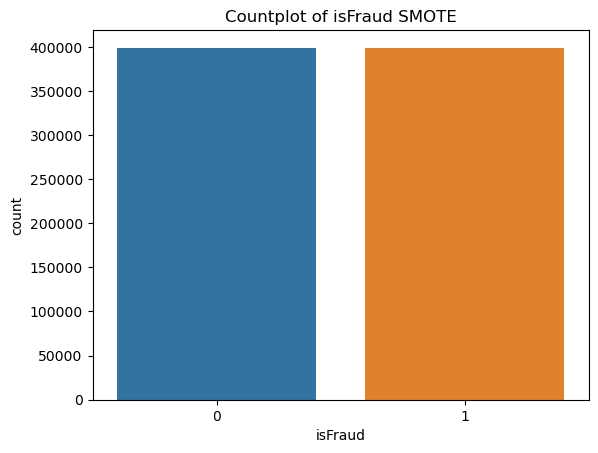

In [62]:
import seaborn as sns

# Menggunakan data dari tabel 'df' dan kolom 'Category'
sns.countplot(x='isFraud', data=dataset_smote)

# Menampilkan judul plot
plt.title('Countplot of isFraud SMOTE')

# Menampilkan plot
plt.show()

### Random Under Sampling

In [63]:
def rus_fit_resample(set_data: pd.DataFrame) -> pd.DataFrame:
    # Create copy of set data
    set_data = set_data.copy()

    # Create sampling object
    rus = RandomUnderSampler(random_state = 123)

    # Balancing set data
    x_rus, y_rus = rus.fit_resample(
        set_data.drop("isFraud", axis = 1),
        set_data.isFraud
    )

    # Concatenate balanced data
    set_data_rus = pd.concat(
        [x_rus, y_rus],
        axis = 1
    )

    # Return balanced data
    return set_data_rus

In [64]:
dataset_rus = rus_fit_resample(dataset_full)

In [65]:
dataset_rus.head()

,card1,card2,card5,addr1,addr2,V1,V4,V5,V10,V12,V13,V14,V19,V20,V25,V35,V36,V41,V53,V54,V61,V65,V66,V75,V76,V82,V88,V107,TransactionAmt,card3,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D10,D11,D15,V2,V3,V6,V7,V8,V9,V11,V15,V16,V17,V18,V21,V22,V23,V24,V26,V27,V28,V29,V30,V31,V32,V33,V34,V37,V38,V39,V40,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V55,V56,V57,V58,V59,V60,V62,V63,V64,V67,V68,V69,V70,V71,V72,V73,V74,V77,V78,V79,V80,V81,V83,V84,V85,...,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,M3_F,M3_T,M3_empty,M6_F,M6_T,M6_empty,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,M1_F,M1_T,M1_empty,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,M2_F,M2_T,M2_empty,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty,M4_M0,M4_M1,M4_M2,M4_empty,isFraud
0,1359.0,314.0,224.0,299.000000,87.000000,1.00000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.0,47.950,150.0,1.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,16.0,1.0,185.0,185.0,3.0,185.0,107.0,185.0,185.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,113.919998,47.950001,0.0000,113.919998,0.0000,47.950001,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
1,9633.0,296.0,138.0,290.739384,86.802487,0.99994,0.846846,0.877289,0.463059,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.00000,0.000000,1.000000,0.00000,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,1.000000,1.000000,1.0,34.561,185.0,1.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,43.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,22.476200,2

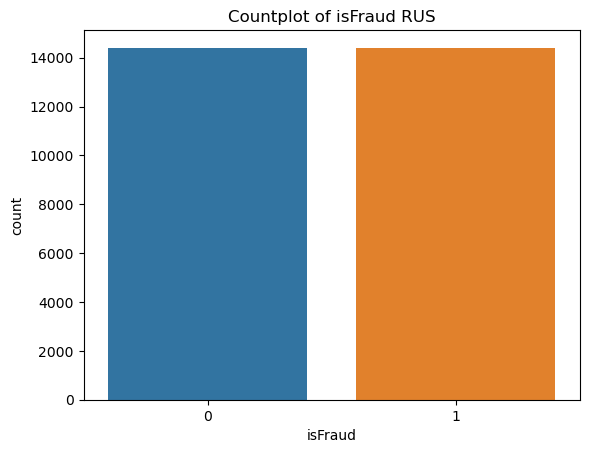

In [66]:
import seaborn as sns

# Menggunakan data dari tabel 'df' dan kolom 'Category'
sns.countplot(x='isFraud', data=dataset_rus)

# Menampilkan judul plot
plt.title('Countplot of isFraud RUS')

# Menampilkan plot
plt.show()

### Random Over Sampling

In [67]:
def ros_fit_resample(set_data: pd.DataFrame) -> pd.DataFrame:
    # Create copy of set data
    set_data = set_data.copy()

    # Create sampling object
    ros = RandomOverSampler(random_state = 123)

    # Balancing set data
    x_ros, y_ros = ros.fit_resample(
        set_data.drop("isFraud", axis = 1),
        set_data.isFraud
    )

    # Concatenate balanced data
    set_data_ros = pd.concat(
        [x_ros, y_ros],
        axis = 1
    )

    # Return balanced data
    return set_data_ros

In [68]:
dataset_ros = ros_fit_resample(dataset_full)

In [69]:
dataset_ros.head()

,card1,card2,card5,addr1,addr2,V1,V4,V5,V10,V12,V13,V14,V19,V20,V25,V35,V36,V41,V53,V54,V61,V65,V66,V75,V76,V82,V88,V107,TransactionAmt,card3,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D10,D11,D15,V2,V3,V6,V7,V8,V9,V11,V15,V16,V17,V18,V21,V22,V23,V24,V26,V27,V28,V29,V30,V31,V32,V33,V34,V37,V38,V39,V40,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V55,V56,V57,V58,V59,V60,V62,V63,V64,V67,V68,V69,V70,V71,V72,V73,V74,V77,V78,V79,V80,V81,V83,V84,V85,...,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,M3_F,M3_T,M3_empty,M6_F,M6_T,M6_empty,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,M1_F,M1_T,M1_empty,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,M2_F,M2_T,M2_empty,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty,M4_M0,M4_M1,M4_M2,M4_empty,isFraud
0,6470.0,111.0,226.0,299.0,87.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.00000,0.000000,1.000000,0.0,0.0,1.0,1.0,1.0,0.000000,0.00000,2.000000,1.000000,1.0,59.00,150.0,5.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,3.0,62.0,0.0,1.0,62.0,62.0,42.0,62.0,1.0,2.0,1.0,2.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,102.000000,102.000000,102.000000,102.0,102.000000,0.0,102.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0
1,7826.0,481.0,224.0,184.0,87.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.00000,1.000000,1.000000,1.0,1.0,1.0,1.0,1.0,1.000000,1.00000,0.000000,1.000000,1.0,39.00,150.0,5.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,98.0,8.0,5.0,0.0,117.0,117.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

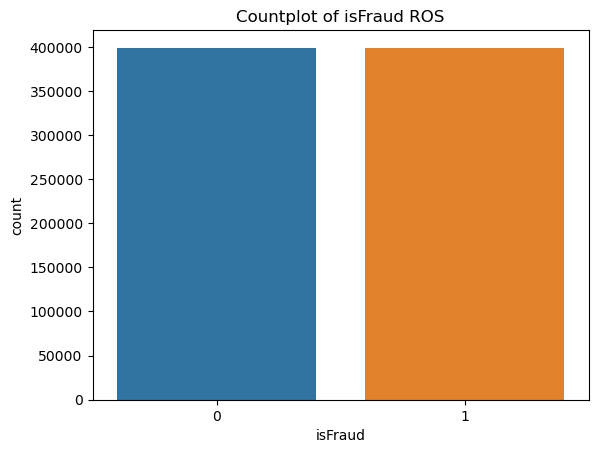

In [70]:
import seaborn as sns

# Menggunakan data dari tabel 'df' dan kolom 'Category'
sns.countplot(x='isFraud', data=dataset_ros)

# Menampilkan judul plot
plt.title('Countplot of isFraud ROS')

# Menampilkan plot
plt.show()

## Standart Scaler

In [71]:
columns_to_scale = ['TransactionAmt', 'card3', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 
                    'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D10', 'D11', 'D15', 'V2', 'V3', 'V6', 'V7', 'V8', 'V9', 'V11', 
                    'V15', 'V16', 'V17', 'V18', 'V21', 'V22', 'V23', 'V24', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 
                    'V33', 'V34', 'V37', 'V38', 'V39', 'V40', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 
                    'V51', 'V52', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V62', 'V63', 'V64', 'V67', 'V68', 'V69', 'V70', 
                    'V71', 'V72', 'V73', 'V74', 'V77', 'V78', 'V79', 'V80', 'V81', 'V83', 'V84', 'V85', 'V86', 'V87', 'V89', 
                    'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 
                    'V104', 'V105', 'V106', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 
                    'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 
                    'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 
                    'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 
                    'V298', 'V299', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 
                    'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321','card1', 'card2', 
                    'card5', 'addr1', 'addr2', 'V1', 'V4', 'V5', 'V10', 'V12', 'V13', 'V14', 'V19', 'V20', 'V25', 'V35', 'V36', 
                    'V41', 'V53', 'V54', 'V61', 'V65', 'V66', 'V75', 'V76', 'V82', 'V88', 'V107']

def fit_scaler(train_data):
    scaler = StandardScaler()
    scaler.fit(train_data.loc[:, columns_to_scale])
    # save scaler
    with open('scaler.pkl', 'wb') as f:
        pickle.dump(scaler, f)
    return scaler

def load_scaler(folder_path):
    # load scaler
    #file_path = os.path.join('scaler.pkl')
    with open(folder_path, 'rb') as f:
        scaler = pickle.load(f)
    return scaler

def transform_data(data, scaler):
    scaled_data = scaler.transform(data.loc[:, columns_to_scale])
    data.loc[:, columns_to_scale] = scaled_data
    return data

In [72]:
X_sm_clean = dataset_smote.drop(columns = "isFraud")
y_sm = dataset_smote["isFraud"]

In [73]:
X_sm_clean = X_sm_clean[sorted(X_sm_clean.columns)]
X_valid_clean = valid_set[sorted(valid_set.columns)]
X_test_clean = test_set[sorted(test_set.columns)]

In [74]:
X_sm_clean.head()

,C1,C10,C11,C12,C13,C14,C2,C3,C4,C5,C6,C7,C8,C9,D1,D10,D11,D15,D2,D3,D4,M1_F,M1_T,M1_empty,M2_F,M2_T,M2_empty,M3_F,M3_T,M3_empty,M4_M0,M4_M1,M4_M2,M4_empty,M6_F,M6_T,M6_empty,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,TransactionAmt,V1,V10,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,...,V3,V30,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V31,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V32,V320,V321,V33,V34,V35,V36,V37,V38,V39,V4,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V5,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V6,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V7,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V8,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V9,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,addr1,addr2,card1,card2,card3,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,card5,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty
0,5.0,0.0,1.0,0.0,3.0,3.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,62.0,62.0,42.0,62.0,0.0,1.0,62.0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,59.00,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,102.000000,102.000000,102.000000,102.0,0.0,102.000000,0.0,102.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.00000,0.000000,1.0,1.0,0.0,1.0,0.0,1.000000,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00000,2.0,2.0,0.0,1.0,0.0,0.0,2.000000,2.0,0.0,0.0,2.0,2.0,1.000000,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,299.0,87.0,6470.0,111.0,150.0,0,0,0,0,1,226.0,0,0,1,0,0
1,5.0,0.0,1.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,117.0,117.0,98.0,8.0,5.0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,39.00,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,1.00000,1.000000,1.0,2.0,0.0,0.0,0.0,1.000000,0.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.00000,1.0,1.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,

In [75]:
X_valid_clean.head()

,C1,C10,C11,C12,C13,C14,C2,C3,C4,C5,C6,C7,C8,C9,D1,D10,D11,D15,D2,D3,D4,M1_F,M1_T,M1_empty,M2_F,M2_T,M2_empty,M3_F,M3_T,M3_empty,M4_M0,M4_M1,M4_M2,M4_empty,M6_F,M6_T,M6_empty,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,TransactionAmt,V1,V10,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,...,V3,V30,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V31,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V32,V320,V321,V33,V34,V35,V36,V37,V38,V39,V4,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V5,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V6,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V7,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V8,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V9,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,addr1,addr2,card1,card2,card3,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,card5,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty
26703,3.0,0.0,4.0,0.0,11.0,3.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,216.0,216.0,216.0,216.0,216.0,31.0,26.0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,100.00,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5455,0.583031,1.0,1.0,0.0,0.000000,0.0,0.999386,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.000000,1.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,1.000000,1.00000,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.0,1.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.0,1.0,1.000000,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,143.0,87.0,7919.0,194.0,150.0,0,0,0,1,0,202.0,0,0,1,0,0
2877,1.0,0.0,1.0,0.0,10.0,1.0,2.0,0.0,0.0,1.0,2.0,0.0,0.0,2.0,266.0,214.0,43.0,52.0,266.0,27.0,26.0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,82.95,0.999919,0.471238,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,73.959999,0.0,0.0,0.0,73.959999,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5455,0.583031,1.0,1.0,0.0,0.845267,0.0,0.999386,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.876918,0.0,0.0,0.0,0.000000,0.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,1.000000,1.00000,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.544975,0.588978,1.0,1.0,0.0,1.0,0.0,0

In [76]:
X_test_clean.head()

,C1,C10,C11,C12,C13,C14,C2,C3,C4,C5,C6,C7,C8,C9,D1,D10,D11,D15,D2,D3,D4,M1_F,M1_T,M1_empty,M2_F,M2_T,M2_empty,M3_F,M3_T,M3_empty,M4_M0,M4_M1,M4_M2,M4_empty,M6_F,M6_T,M6_empty,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,TransactionAmt,V1,V10,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,...,V3,V30,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V31,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V32,V320,V321,V33,V34,V35,V36,V37,V38,V39,V4,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V5,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V6,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V7,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V8,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V9,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,addr1,addr2,card1,card2,card3,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,card5,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty
504494,1.0,2.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,42.0,51.0,0.0,8.0,25.0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,20.00,0.999982,0.462382,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,75.0,75.0,75.0,25.0,1.0,25.0,0.0,25.0,25.0,25.0,25.0,0.0,0.0,0.0,50.0,1.0,50.0,50.0,0.0,0.0,0.542504,0.578459,1.0,1.0,0.0,0.84573,0.0,0.999275,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.875881,0.0,0.0,0.0,0.578011,0.619689,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.830721,1.0,0.0,0.0,0.999675,0.981306,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.54407,0.586947,1.0,1.0,0.0,1.0,0.0,0.0,0.845721,1.0,0.0,0.0,1.0,1.0,0.999401,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,1.0,1.0,203.000000,87.000000,7919.0,194.0,150.0,0,0,0,1,0,166.0,0,0,1,0,0
454181,1.0,0.0,1.0,0.0,11.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,615.0,615.0,615.0,615.0,615.0,28.0,615.0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,470.00,1.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,240.0,0.0,0.0,0.0,240.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.0,1.0,0.0,1.00000,0.0,1.000000,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.000000,1.0,0.0,0.0,1.000000,1.000000,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.00000,1.000000,1.0,1.0,0.0,1.0,0.0

In [77]:
scaler = fit_scaler(X_sm_clean)

In [78]:
scaling = load_scaler('scaler.pkl')

In [79]:
X_sm_clean = transform_data(X_sm_clean, scaling)
X_valid_clean = transform_data(X_valid_clean, scaling)
X_test_clean = transform_data(X_test_clean, scaling)

In [80]:
X_sm_clean.head()

,C1,C10,C11,C12,C13,C14,C2,C3,C4,C5,C6,C7,C8,C9,D1,D10,D11,D15,D2,D3,D4,M1_F,M1_T,M1_empty,M2_F,M2_T,M2_empty,M3_F,M3_T,M3_empty,M4_M0,M4_M1,M4_M2,M4_empty,M6_F,M6_T,M6_empty,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,TransactionAmt,V1,V10,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,...,V3,V30,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V31,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V32,V320,V321,V33,V34,V35,V36,V37,V38,V39,V4,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V5,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V6,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V7,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V8,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V9,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,addr1,addr2,card1,card2,card3,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,card5,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty
0,-0.097170,-0.084263,-0.11352,-0.084443,-0.173159,-0.089850,-0.119697,-0.02847,-0.092114,-0.170119,-0.104358,-0.077676,-0.089946,-0.155603,-0.032138,-0.101045,-0.296961,-0.280810,-1.017132,-0.349732,-0.138613,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,-0.351666,0.012801,-1.349080,0.738407,-0.043254,-0.053787,-0.051213,-0.154407,-0.095458,-0.105800,0.016629,-0.13485,-0.168177,...,3.879546,-0.483641,-0.184192,-0.194990,-0.770433,-0.66716,-0.736112,-0.001583,-0.013219,-0.094489,-0.063455,0.752277,-0.578906,-0.062833,-0.047767,0.242400,-0.267435,-0.277519,-0.270811,-0.05497,-0.083032,-0.078446,-0.068818,-0.568724,-0.113975,-0.094823,-0.584319,-0.587413,-1.103491,-1.107775,-0.209675,-0.236165,-0.462574,0.533348,-0.43963,0.031523,-0.54195,-0.507362,-0.222775,-0.252980,-0.210794,-0.236479,-0.432341,-0.422474,0.321575,-0.582416,-0.540077,-0.504525,-1.090426,-1.091222,-0.220788,-0.20972,-0.530294,-0.512343,-0.512298,-0.127713,-0.490415,0.305177,0.070591,-0.526249,-0.497847,0.019952,0.007192,-0.116273,-0.01548,-0.494782,4.732937,-0.482529,-0.538988,-0.520635,-0.543913,-0.537431,-1.026152,-1.031303,0.746654,0.436240,-0.530633,-0.105032,-0.465252,-0.455283,2.809827,2.188440,-0.554371,-0.513939,0.711349,0.548238,0.031973,-0.01899,5.923395,-0.497271,-0.483058,-0.56027,-0.545769,-0.598796,0.012118,-0.050097,-0.020243,2.908314,0.07534,0.083922,0.114978,-0.672041,-1.634015,-0.519882,0,0,0,0,1,0.709765,0,0,1,0,0
1,-0.097170,-0.084263,-0.11352,-0.084443,

In [81]:
X_valid_clean.head()

,C1,C10,C11,C12,C13,C14,C2,C3,C4,C5,C6,C7,C8,C9,D1,D10,D11,D15,D2,D3,D4,M1_F,M1_T,M1_empty,M2_F,M2_T,M2_empty,M3_F,M3_T,M3_empty,M4_M0,M4_M1,M4_M2,M4_empty,M6_F,M6_T,M6_empty,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,TransactionAmt,V1,V10,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,...,V3,V30,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V31,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V32,V320,V321,V33,V34,V35,V36,V37,V38,V39,V4,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V5,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V6,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V7,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V8,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V9,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,addr1,addr2,card1,card2,card3,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,card5,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty
26703,-0.107858,-0.084263,-0.09078,-0.084443,-0.117441,-0.089850,-0.110572,-0.02847,-0.092114,-0.120069,-0.124702,-0.077676,-0.089946,-0.001088,1.111526,0.930341,1.178856,0.636144,0.913292,0.441223,-0.383166,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-0.165236,0.012801,1.825996,-0.324746,-0.043254,-0.053787,-0.051213,-0.154407,-0.095458,-0.105800,0.016629,-0.13485,-0.168177,...,-0.188025,1.747669,-0.184192,-0.19499,-0.770433,-0.667160,-0.736112,-0.001583,-0.072524,-0.121692,-0.108243,-0.143031,-0.578906,-0.331551,-0.047767,-0.273593,-0.267435,-0.277519,-0.270811,-0.05497,-0.083032,-0.078446,-0.068818,-0.568724,-0.113975,-0.094823,-0.584319,-0.587413,0.193392,0.171201,-0.209675,-0.236165,-0.462574,-3.044807,-0.43963,-0.002083,-0.54195,-0.507362,-0.222775,-0.252980,-0.210794,-0.236479,-0.432341,-0.422474,-2.703201,-0.582416,-0.540077,-0.504525,1.006675,0.819803,-0.220788,-0.20972,-0.530294,-0.512343,-0.512298,-0.127713,-0.490415,-2.160142,-1.898509,-0.526249,-0.497847,0.019952,0.007192,-0.116273,-0.01548,1.900177,-0.171088,1.746804,-0.538988,-0.520635,-0.543913,-0.537431,1.104154,0.917449,-0.247772,-0.250937,-0.530633,-0.105032,-0.465252,-0.455283,-2.248507,-2.060758,-0.554371,-0.513939,-0.269695,-0.293389,0.031973,-0.01899,-0.149357,1.888562,1.727692,-0.56027,-0.545769,-0.598796,-0.053431,-0.084524,-0.070281,-0.258158,-0.34071,-1.739861,0.114978,-0.372079,-1.098303,-0.519882,0,0,0,1,0,0.143774,0,0,1,0,0
2877,-0.118545,-0.084263,-0.11352,

In [82]:
X_test_clean.head()

,C1,C10,C11,C12,C13,C14,C2,C3,C4,C5,C6,C7,C8,C9,D1,D10,D11,D15,D2,D3,D4,M1_F,M1_T,M1_empty,M2_F,M2_T,M2_empty,M3_F,M3_T,M3_empty,M4_M0,M4_M1,M4_M2,M4_empty,M6_F,M6_T,M6_empty,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_empty,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,TransactionAmt,V1,V10,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,...,V3,V30,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V31,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V32,V320,V321,V33,V34,V35,V36,V37,V38,V39,V4,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V5,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V6,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V7,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V8,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V9,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,addr1,addr2,card1,card2,card3,card4_american express,card4_discover,card4_empty,card4_mastercard,card4_visa,card5,card6_charge card,card6_credit,card6_debit,card6_debit or credit,card6_empty
504494,-0.118545,-0.069562,-0.11352,-0.084443,-0.187089,-0.120332,-0.124260,-0.02847,-0.081812,-0.170119,-0.124702,-0.077676,-0.082592,-0.232860,-0.492574,-0.516278,-0.296961,-0.346307,-1.017132,-0.165176,-0.389959,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,-0.529002,0.008381,0.119019,0.738407,-0.043254,-0.053787,-0.051213,1.642869,0.297893,0.604907,0.016629,-0.13485,-0.168177,...,-0.188025,-0.483641,2.970204,2.573745,1.042588,0.703542,0.900735,-0.001583,-0.028918,-0.101690,-0.075311,0.076407,1.740007,-0.265689,-0.047767,-0.147124,-0.038054,-0.156033,-0.094839,-0.05497,-0.083032,-0.078446,0.135445,1.680484,0.013611,0.075900,-0.584319,-0.587413,0.186270,0.161170,-0.209675,-0.236165,-0.462574,-0.018654,-0.439630,-0.008204,-0.541950,-0.507362,-0.222775,-0.252980,-0.210794,-0.236479,-0.432341,-0.422474,-0.053857,-0.582416,-0.540077,-0.504525,0.121721,0.093019,-0.220788,-0.20972,-0.530294,-0.512343,-0.512298,-0.127713,-0.490415,-0.112149,0.070591,-0.526249,-0.497847,-0.003138,-0.068620,-0.116273,-0.01548,-0.494782,-0.171088,-0.482529,-0.538988,-0.520635,-0.543913,-0.537431,0.132883,0.112511,-0.247772,-0.250937,-0.530633,-0.105032,-0.465252,-0.455283,-0.109539,0.063841,-0.554371,-0.513939,-0.269695,-0.293389,0.006845,-0.01899,-0.149357,-0.497271,-0.483058,-0.56027,-0.545769,-0.598796,0.077667,-0.015669,0.029796,2.908314,0.07534,-1.038406,0.114978,-0.372079,-1.098303,-0.519882,0,0,0,1,0,-0.705213,0,0,1,0,0
454181,-0.118545,-0.084263,-0.11352,-

## Training Model

In [83]:
#import all realated libraries
#import libraries for data analysis
import numpy as np
import pandas as pd

# import library for visualization
import seaborn as sns
import matplotlib.pyplot as plt

# import pickle and json file for columns and model file
import pickle
import json
import joblib

# import warnings for ignore the warnings
import warnings 
warnings.filterwarnings("ignore")

# library for model selection and models
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
import xgboost as xgb
import lightgbm as lgb
from lightgbm import LGBMClassifier

# evaluation metrics for classification model
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, roc_auc_score

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from scikeras.wrappers import KerasClassifier
from tensorflow import keras
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

## Baseline Model

In [86]:
y_sm.value_counts(normalize = True)

0    0.5
1    0.5
Name: isFraud, dtype: float64

In [87]:
y_baseline_predict = y_sm.mean()
y_baseline_predict

0.5

## Logistic Regression

In [88]:
# Build Logistic Regression
logreg_awal = LogisticRegression(random_state = 123)

In [89]:
# fit Logistic Regression
logreg_awal.fit(X_sm_clean, y_sm)

LogisticRegression(random_state=123)

In [132]:
logreg = '1_logreg.pkl'
with open(logreg, 'wb') as file:
    pickle.dump(logreg_awal, file)

In [133]:
# Nama file model yang telah disimpan
logreg_file = '1_logreg.pkl'

# Melakukan pembacaan (load) model
with open(logreg_file, 'rb') as file:
    logreg_awal = pickle.load(file)

In [134]:
# Melihat Score dari model logreg
logreg_awal.score(X_sm_clean, y_sm)

0.9161396807254736

In [91]:
#Prediksi Logreg
logreg_pred = logreg_awal.predict(X_test_clean)

In [92]:
#Melihat Classification report
print(classification_report(y_test, logreg_pred, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.98      0.95      0.96    102546
           1       0.23      0.41      0.29      3751

    accuracy                           0.93    106297
   macro avg       0.60      0.68      0.63    106297
weighted avg       0.95      0.93      0.94    106297



In [93]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, logreg_pred)
precision = precision_score(y_test, logreg_pred)
recall = recall_score(y_test, logreg_pred)
f1 = f1_score(y_test, logreg_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9294147530033773
Precision: 0.22573099415204678
Recall: 0.411623567048787
F1 Score: 0.29156831271834577


AUC: 0.8092172488652191


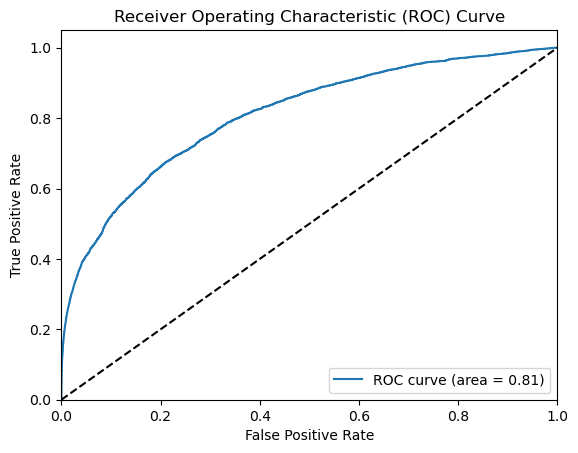

In [94]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = logreg_awal.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

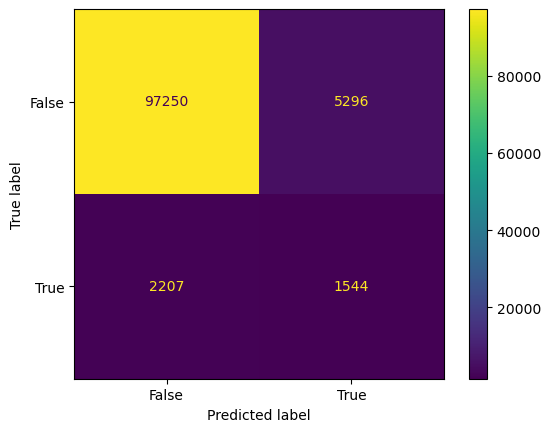

In [95]:
ConfusionMatrixDisplay.from_predictions(y_test, logreg_pred, display_labels = [False, True])
plt.show()

In [96]:
#Melihat score data train, validation dan test
print("Train_Score = ", logreg_awal.score(X_sm_clean, y_sm), 
      "Valid_Score = ",logreg_awal.score(X_valid_clean, y_valid),
      "Test_Score = ", logreg_awal.score(X_test_clean, y_test))

Train_Score =  0.9161396807254736 Valid_Score =  0.929034078882382 Test_Score =  0.9294147530033773


In [97]:
# Get the feature importance
feature_importance = logreg_awal.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

                            Feature  Importance
2                               C11    2.552271
6                                C2    1.970874
150                             V18    1.142079
12                               C8    1.030633
215                             V38    1.017949
273                             V90    1.008362
22                             M1_T    0.999058
8                                C4    0.996302
205                            V318    0.932904
222                             V44    0.916644
210                             V33    0.896517
178                            V294    0.844831
269                             V87    0.746301
4                               C13    0.713077
194                            V308    0.694310
177                            V293    0.662897
207                             V32    0.645309
260                             V79    0.618634
227                             V49    0.601138
255                             V74    0

## Tunning Logreg

In [111]:
# Build Logistic Regression
logreg = LogisticRegression(random_state = 123)

In [112]:
# Membentuk parameter untuk eksperimentasi
lr_param_grid = {
    'C': [0.1, 1.0, 10.0],
    'penalty': ['l2','none'],
    'solver' : ['liblinear', 'sag', 'saga']
}

In [113]:
# Cross Validation menggunakan GridsearchCV
lr_grid = GridSearchCV(logreg, lr_param_grid, verbose=3, cv= 5, scoring='accuracy')

In [114]:
#Fitting Model lr grid
lr_grid.fit(X_sm_clean, y_sm)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END C=0.1, penalty=l2, solver=liblinear;, score=0.885 total time=13.7min
[CV 2/5] END C=0.1, penalty=l2, solver=liblinear;, score=0.929 total time=16.1min
[CV 3/5] END C=0.1, penalty=l2, solver=liblinear;, score=0.924 total time= 9.5min
[CV 4/5] END C=0.1, penalty=l2, solver=liblinear;, score=0.923 total time= 9.1min
[CV 5/5] END C=0.1, penalty=l2, solver=liblinear;, score=0.928 total time=16.5min
[CV 1/5] END .....C=0.1, penalty=l2, solver=sag;, score=0.858 total time= 7.3min
[CV 2/5] END .....C=0.1, penalty=l2, solver=sag;, score=0.881 total time= 7.2min
[CV 3/5] END .....C=0.1, penalty=l2, solver=sag;, score=0.881 total time= 7.3min
[CV 4/5] END .....C=0.1, penalty=l2, solver=sag;, score=0.882 total time= 7.2min
[CV 5/5] END .....C=0.1, penalty=l2, solver=sag;, score=0.882 total time= 7.3min
[CV 1/5] END ....C=0.1, penalty=l2, solver=saga;, score=0.849 total time=20.3min
[CV 2/5] END ....C=0.1, penalty=l2, solver=

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=123),
             param_grid={'C': [0.1, 1.0, 10.0], 'penalty': ['l2', 'none'],
                         'solver': ['liblinear', 'sag', 'saga']},
             scoring='accuracy', verbose=3)

In [115]:
#Melihat parameter terbaik untuk model
print(lr_grid.best_params_)

{'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}


In [124]:
#Input parameter terbaik hasil GridsearchCV
lr_grid_cv  = LogisticRegression(C = lr_grid.best_params_["C"],
                                 penalty = lr_grid.best_params_["penalty"],
                                 solver = lr_grid.best_params_["solver"])

#Kembali fitting model
lr_grid_cv.fit(X_sm_clean, y_sm)

LogisticRegression(C=0.1, solver='liblinear')

In [139]:
#Save Model
logreg_cv = '2_logreg_cv.pkl'
with open(logreg_cv, 'wb') as file:
    pickle.dump(lr_grid_cv, file)

In [136]:
# Load Model
# Nama file model yang telah disimpan
logreg_cv_file = '2_logreg_cv.pkl'

# Melakukan pembacaan (load) model
with open(logreg_cv_file, 'rb') as file:
    lr_grid_cv = pickle.load(file)

In [137]:
#Prediksi dengan menggunakan data test
logregtun_pred = lr_grid_cv.predict(X_test_clean)

In [138]:
#Melihat Classification report
print(classification_report(y_test, logregtun_pred, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97    102546
           1       0.24      0.41      0.31      3751

    accuracy                           0.93    106297
   macro avg       0.61      0.68      0.64    106297
weighted avg       0.95      0.93      0.94    106297



In [127]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, logregtun_pred)
precision = precision_score(y_test, logregtun_pred)
recall = recall_score(y_test, logregtun_pred)
f1 = f1_score(y_test, logregtun_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9344007827125883
Precision: 0.24461001902346227
Recall: 0.4113569714742735
F1 Score: 0.30678993935778903


AUC: 0.8170440073208778


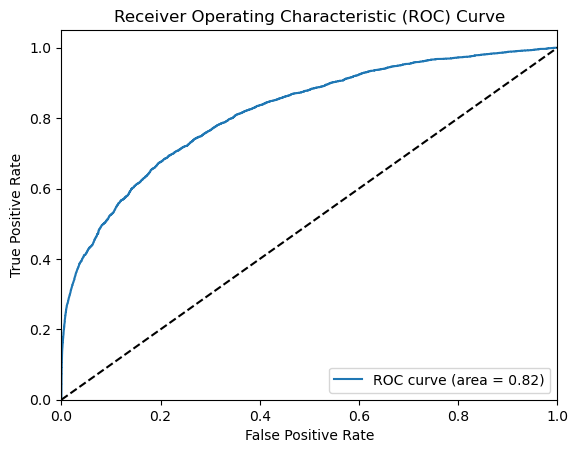

In [128]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = lr_grid_cv.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

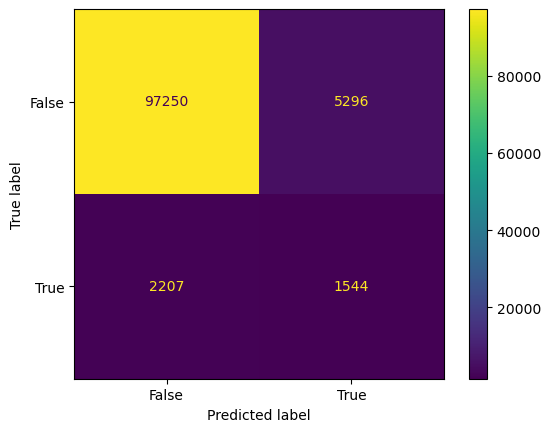

In [129]:
ConfusionMatrixDisplay.from_predictions(y_test, logreg_pred, display_labels = [False, True])
plt.show()

In [130]:
print(f"Training Data Score: {lr_grid_cv.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {lr_grid_cv.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {lr_grid_cv.score(X_test_clean, y_test)}")

Training Data Score: 0.9186398875094932
Validating Data Score: 0.933987158682001
Testing Data Score: 0.9344007827125883


In [131]:
# Get the feature importance
feature_importance = lr_grid_cv.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

                            Feature  Importance
2                               C11    3.787551
8                                C4    1.881919
12                               C8    1.800389
150                             V18    1.269697
178                            V294    0.935848
154                             V21    0.832610
22                             M1_T    0.784758
222                             V44    0.738913
6                                C2    0.731209
205                            V318    0.673657
215                             V38    0.670051
210                             V33    0.576123
223                             V45    0.565719
269                             V87    0.554905
273                             V90    0.509179
14                               D1    0.502482
227                             V49    0.498518
13                               C9    0.470880
177                            V293    0.460500
260                             V79    0

## Support Vector Classifier

In [83]:
svc_ori = SVC(random_state = 123)

In [ ]:
# fit Support Vector Classifier
svc_ori.fit(X_sm_clean, y_sm)

In [ ]:
#Cek Score model SVC
svc_ori.score(X_sm_clean, y_sm)

In [ ]:
svc_predict = svc_ori.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, svc_predict, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, svc_predict)
precision = precision_score(y_test, svc_predict)
recall = recall_score(y_test, svc_predict)
f1 = f1_score(y_test, svc_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = svc_ori.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, svc_predict, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {svc_ori.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {svc_ori.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {svc_ori.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = svc_ori.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning SVC

In [ ]:
# Create the GridSearchCV model
# Create the GridSearch estimator along with a parameter object containing the values to adjust
param_grid = {'kernel' : ['linear', 'rbf', 'poly', 'sigmoid'],
              'C': [0.0005,0.001, 0.01, 0.1, 0.5],
              'gamma': ['scale', 'auto']
             }

In [ ]:
#Membentuk parameter untuk eksperimentasi
svc_grid = GridSearchCV(SVC(random_state = 123), 
                        param_grid, 
                        verbose=3, 
                        cv= 5, 
                        n_jobs=4, 
                        scoring='accuracy')

In [ ]:
#Melakukan fitting model gridsearchcv
svc_grid.fit(X_sm_clean, y_sm)

In [ ]:
#Melihat parameter terbaik
svc_grid.best_params_

In [ ]:
#Melakukan input parameter terbaik hasil gridsearch
svc_grid_cv  = SVC(kernel = svc_grid.best_params_["kernel"],
                   gamma = svc_grid.best_params_["gamma"],
                   C = svc_grid.best_params_["C"]
                  )

In [ ]:
svc_grid_cv.fit(X_sm_clean, y_sm)

In [ ]:
svc_pred_cv = svc_grid_cv.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, svc_pred_cv, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, svc_predict)
precision = precision_score(y_test, svc_predict)
recall = recall_score(y_test, svc_predict)
f1 = f1_score(y_test, svc_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = svc_ori.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, svc_pred_cv, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {svc_grid_cv.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {svc_grid_cv.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {svc_grid_cv.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = svc_grid_cv.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## DecisionTree

In [ ]:
# Model Decision Tree
decTree = DecisionTreeClassifier(random_state = 123)

In [ ]:
# Fitting model
decTree.fit(X_sm_clean, y_sm)

In [ ]:
# Model score
decTree.score(X_sm_clean, y_sm)

In [ ]:
#Prediksi data menggunakan data test
dectree_predict = decTree.predict(X_test_clean)

In [ ]:
#Melihat Classification report
print(classification_report(y_test, dectree_predict, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, dectree_predict)
precision = precision_score(y_test, dectree_predict)
recall = recall_score(y_test, dectree_predict)
f1 = f1_score(y_test, dectree_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = decTree.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, dectree_predict, display_labels = [False, True])
plt.show()

In [ ]:
#Melihat score prediksi dari data train, valid dan test
print(f"Training Data Score: {decTree.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {decTree.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {decTree.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = decTree.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning DecisionTree

In [ ]:
# Buat parameter untuk eksperimen
decTree_param = {"max_depth": [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                "criterion": ["gini", "entropy", "log_loss"],
                 'min_samples_split': [2, 5, 10],
                 'min_samples_leaf': [1, 2, 4],}

In [ ]:
# Buat plan eksperimentasi
random_decTree = GridSearchCV(estimator = DecisionTreeClassifier(random_state=123),
                              param_grid = decTree_param,
                              cv = 5,
                              scoring = "accuracy") 

In [ ]:
# Lakukan fitting eksperimentasi
random_decTree.fit(X_sm_clean, y_sm)

In [ ]:
random_decTree.best_params_

In [ ]:
# Buat model
best_decTree = DecisionTreeClassifier(max_depth = random_decTree.best_params_["max_depth"],
                                      criterion = random_decTree.best_params_["criterion"],
                                      min_samples_leaf = random_decTree.best_params_["min_samples_leaf"],
                                      min_samples_split = random_decTree.best_params_["min_samples_split"],
                                      random_state = 123)

In [ ]:
# Fit model
best_decTree.fit(X_sm_clean, y_sm)

In [ ]:
# Cek Train data
best_decTree.score(X_sm_clean, y_sm)

In [ ]:
y_predict_dectree = best_decTree.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, y_predict_dectree))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, y_predict_dectree)
precision = precision_score(y_test, y_predict_dectree)
recall = recall_score(y_test, y_predict_dectree)
f1 = f1_score(y_test, y_predict_dectree)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = best_decTree.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predict_dectree, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {best_decTree.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {best_decTree.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {best_decTree.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = best_decTree.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Randomforest Classifier

In [ ]:
# Build random forest
random_forest = RandomForestClassifier(n_estimators = 100, 
                                       criterion = "gini",
                                       max_features = "sqrt",
                                       max_depth=6, 
                                       min_samples_leaf=8,
                                       random_state = 123)

In [ ]:
random_forest.fit(X_sm_clean, y_sm)

In [ ]:
# Model score
random_forest.score(X_sm_clean, y_sm)

In [ ]:
y_pred_rf = random_forest.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, y_pred_rf, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = random_forest.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rf, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {random_forest.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {random_forest.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {random_forest.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = random_forest.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Randomforest Classifier

In [ ]:
# Buat parameter untuk eksperimen
random_param = {"max_depth": [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                'n_estimators': [50, 100, 200],
                'min_samples_leaf': [1, 2, 4],
                'min_samples_split': [2, 5, 10],
                "criterion": ["gini", "entropy"]
                }

In [ ]:
# Buat plan eksperimentasi
random_forestcls = GridSearchCV(estimator = RandomForestClassifier(random_state=123),
                                param_grid = random_param,
                                cv = 5,
                                scoring = "accuracy") 

In [ ]:
# Lakukan fitting eksperimentasi
random_forestcls.fit(X_sm_clean, y_sm)

In [ ]:
random_forestcls.best_params_

In [ ]:
# Buat model
random_forestcls_cv = RandomForestClassifier(max_depth = random_forestcls.best_params_["max_depth"],
                                             criterion = random_forestcls.best_params_["criterion"],
                                             n_estimators = random_forestcls.best_params_["n_estimators"],
                                             min_samples_leaf = random_forestcls.best_params_["min_samples_leaf"],
                                             min_samples_split = random_forestcls.best_params_["min_samples_split"],
                                             random_state = 123)

In [ ]:
# Fit model
random_forestcls_cv.fit(X_sm_clean, y_sm)

In [ ]:
predict_randomcls_cv = random_forestcls_cv.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, predict_randomcls_cv))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, predict_randomcls_cv)
precision = precision_score(y_test, predict_randomcls_cv)
recall = recall_score(y_test, predict_randomcls_cv)
f1 = f1_score(y_test, predict_randomcls_cv)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = random_forestcls_cv.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, predict_randomcls_cv, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {random_forestcls_cv.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {random_forestcls_cv.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {random_forestcls_cv.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = random_forestcls_cv.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Ridge Classifier

In [ ]:
ridge = RidgeClassifier(random_state = 123) #create a ridge classifier object

In [ ]:
ridge.fit(X_sm_clean, y_sm) #train the model

In [ ]:
ridge.score(X_sm_clean, y_sm)

In [ ]:
pred_ridge = ridge.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, pred_ridge, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, pred_ridge)
precision = precision_score(y_test, pred_ridge)
recall = recall_score(y_test, pred_ridge)
f1 = f1_score(y_test, pred_ridge)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = ridge.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, pred_ridge, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {ridge.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {ridge.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {ridge.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = ridge.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter Ridge Classifier

In [ ]:
clf_ridge = RidgeClassifier(random_state = 123)

alpha = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

# define grid search
grid = dict(alpha=alpha)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

ridge_cv = GridSearchCV(estimator=clf_ridge, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)

In [ ]:
ridge_cv.fit(X_sm_clean, y_sm)

In [ ]:
ridge_cv.best_params_

In [ ]:
# Buat model
ridge_cv = RidgeClassifier(alpha = ridge_cv.best_params_["alpha"],
                           random_state = 123)

In [ ]:
# Fit model
ridge_cv.fit(X_sm_clean, y_sm)

In [ ]:
# Cek Test data
ridge_cv.score(X_sm_clean, y_sm)

In [ ]:
predict_ridgecv = ridge_cv.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, predict_ridgecv))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, predict_ridgecv)
precision = precision_score(y_test, predict_ridgecv)
recall = recall_score(y_test, predict_ridgecv)
f1 = f1_score(y_test, predict_ridgecv)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = ridge_cv.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, predict_ridgecv, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {ridge_cv.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {ridge_cv.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {ridge_cv.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = ridge_cv.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## KNeighborsClassifier

In [ ]:
# Build KNeighborsRegressor
knn_awal = KNeighborsClassifier()

In [ ]:
# fit KNeighborsRegressor
knn_awal.fit(X_sm_clean, y_sm)

In [ ]:
knn_awal.score(X_sm_clean, y_sm)

In [ ]:
knn_pred = knn_awal.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, knn_pred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, knn_pred)
precision = precision_score(y_test, knn_pred)
recall = recall_score(y_test, knn_pred)
f1 = f1_score(y_test, knn_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = knn_awal.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, knn_pred, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {knn_awal.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {knn_awal.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {knn_awal.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = knn_awal.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning KNeighborsClassifier

In [ ]:
kn_param_grid = {
    'n_neighbors' : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30],
    'weights' : ['uniform', 'distance'],
    'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
}

In [ ]:
knn = KNeighborsClassifier()

In [ ]:
kn_grid = GridSearchCV(knn, kn_param_grid, verbose=3, cv= 5, scoring='accuracy')

In [ ]:
kn_grid.fit(X_sm_clean, y_sm)

In [ ]:
print(kn_grid.best_params_)

In [ ]:
# Refit the KNeighborsRegressor
kn_grid = KNeighborsClassifier(n_neighbors = kn_grid.best_params_["n_neighbors"],
                               weights = kn_grid.best_params_["weights"],
                               algorithm = kn_grid.best_params_["algorithm"]
                              )

In [ ]:
kn_grid.fit(X_sm_clean, y_sm)

In [ ]:
knn_cvpred = kn_grid.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, knn_cvpred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, knn_cvpred)
precision = precision_score(y_test, knn_cvpred)
recall = recall_score(y_test, knn_cvpred)
f1 = f1_score(y_test, knn_cvpred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = kn_grid.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, knn_cvpred, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {kn_grid.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {kn_grid.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {kn_grid.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = kn_grid.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Bagging Classifier

In [ ]:
dec_tree = DecisionTreeClassifier(random_state=123)

In [ ]:
bagging_cls = BaggingClassifier(base_estimator=dec_tree, n_estimators=10, random_state=123)

In [ ]:
# fit KNeighborsRegressor
bagging_cls.fit(X_sm_clean, y_sm)

In [ ]:
bagging_cls.score(X_sm_clean, y_sm)

In [ ]:
bagging_predict = bagging_cls.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, bagging_predict, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, bagging_predict)
precision = precision_score(y_test, bagging_predict)
recall = recall_score(y_test, bagging_predict)
f1 = f1_score(y_test, bagging_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = bagging_cls.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, bagging_predict, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {bagging_cls.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {bagging_cls.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {bagging_cls.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = bagging_cls.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter Bagging Classifier

In [ ]:
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=123)
bagging_param_grid = {'n_estimators' : [10, 100, 1000]}

In [ ]:
bagging_grid_cv = GridSearchCV(estimator=BaggingClassifier(random_state=123), 
                               param_grid=bagging_param_grid, 
                               n_jobs=-1, 
                               cv=cv, 
                               scoring='accuracy',
                               error_score=0)

In [ ]:
bagging_grid_cv.fit(X_sm_clean, y_sm)

In [ ]:
bagging_grid_cv.best_params_

In [ ]:
bagging_cv  = BaggingClassifier(n_estimators = bagging_grid_cv.best_params_["n_estimators"])

In [ ]:
bagging_cv.fit(X_sm_clean, y_sm)

In [ ]:
baggingcv_predict = bagging_cv.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, baggingcv_predict, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, baggingcv_predict)
precision = precision_score(y_test, baggingcv_predict)
recall = recall_score(y_test, baggingcv_predict)
f1 = f1_score(y_test, baggingcv_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = bagging_cv.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, baggingcv_predict, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {bagging_cv.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {bagging_cv.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {bagging_cv.score(X_test_clean, y_test)}")

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, baggingcv_predict, display_labels = [False, True])
plt.show()

In [ ]:
# Get the feature importance
feature_importance = bagging_cv.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Gradient Boosting

In [ ]:
# Build GradientBoosting
grad_boost = GradientBoostingClassifier(random_state = 123)

In [ ]:
# Fit GradientBoosting
grad_boost.fit(X_sm_clean, y_sm)

In [ ]:
grad_boost.score(X_sm_clean, y_sm)

In [ ]:
gradboost_predict = grad_boost.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, gradboost_predict, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, gradboost_predict)
precision = precision_score(y_test, gradboost_predict)
recall = recall_score(y_test, gradboost_predict)
f1 = f1_score(y_test, gradboost_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = grad_boost.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, gradboost_predict, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {grad_boost.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {grad_boost.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {grad_boost.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = grad_boost.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter Gradient Boosting

In [ ]:
grad_param_grid = {
    'n_estimators' : [10, 50, 100],
    'learning_rate' : [0.001, 0.01, 0.1],
    'subsample' : [0.5, 0.7, 1.0],
    'max_depth' : [3, 7, 9]
}

In [ ]:
grad_grid_cv = GridSearchCV(estimator=GradientBoostingClassifier(), 
                           param_grid=grad_param_grid,
                           cv=5, 
                           scoring='accuracy',
                           error_score=0)

In [ ]:
grad_grid_cv.fit(X_sm_clean, y_sm)

In [ ]:
grad_grid_cv.best_params_

In [ ]:
gradboost_cv  = GradientBoostingClassifier(n_estimators = grad_grid_cv.best_params_["n_estimators"],
                                           learning_rate = grad_grid_cv.best_params_["learning_rate"],
                                           subsample = grad_grid_cv.best_params_["subsample"],
                                           max_depth = grad_grid_cv.best_params_["max_depth"],
                                           random_state = 123)

In [ ]:
gradboost_cv.fit(X_sm_clean, y_sm)

In [ ]:
gradboost_pred_cv = gradboost_cv.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, gradboost_pred_cv, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, gradboost_pred_cv)
precision = precision_score(y_test, gradboost_pred_cv)
recall = recall_score(y_test, gradboost_pred_cv)
f1 = f1_score(y_test, gradboost_pred_cv)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = gradboost_cv.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, gradboost_pred_cv, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {gradboost_cv.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {gradboost_cv.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {gradboost_cv.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = gradboost_cv.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

### Adaboost SVC

In [ ]:
svc = SVC(probability=True, kernel='linear', random_state = 123)

# Create adaboost classifer object
adaboost_svc = AdaBoostClassifier(n_estimators=50, 
                                  base_estimator=svc,
                                  learning_rate=1)

In [ ]:
# Train Adaboost Classifer
adaboost_svc.fit(X_sm_clean, y_sm)

In [ ]:
adaboost_svc.score(X_sm_clean, y_sm)

In [ ]:
ada_predict = adaboost_svc.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, ada_predict, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, ada_predict)
precision = precision_score(y_test, ada_predict)
recall = recall_score(y_test, ada_predict)
f1 = f1_score(y_test, ada_predict)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = adaboost_svc.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, ada_predict, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {adaboost_svc.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {adaboost_svc.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {adaboost_svc.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = adaboost_svc.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

### Adaboost Original

In [ ]:
# Create adaboost classifer object
abc = AdaBoostClassifier(n_estimators=50,
                         learning_rate=1,
                         random_state = 123)

In [ ]:
# Train Adaboost Classifer
abc_ori = abc.fit(X_sm_clean, y_sm)

In [ ]:
abc_ori.score(X_sm_clean, y_sm)

In [ ]:
adaboost_pred_ori = abc_ori.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, adaboost_pred_ori, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, adaboost_pred_ori)
precision = precision_score(y_test, adaboost_pred_ori)
recall = recall_score(y_test, adaboost_pred_ori)
f1 = f1_score(y_test, adaboost_pred_ori)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = abc_ori.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, adaboost_pred_ori, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {abc_ori.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {abc_ori.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {abc_ori.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = abc_ori.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter Adaboost

In [ ]:
adaboost = AdaBoostClassifier(random_state = 123)

In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.1, 0.5, 1.0],
    'algorithm': ['SAMME', 'SAMME.R']
}

In [ ]:
grid_search_adaboost = GridSearchCV(adaboost, param_grid, scoring='accuracy', cv=5)

In [ ]:
grid_search_adaboost.fit(X_sm_clean, y_sm)

In [ ]:
print(grid_search_adaboost.best_params_)

In [ ]:
adaboost_best = AdaBoostClassifier(n_estimators = grid_search_adaboost.best_params_["n_estimators"],
                                   learning_rate = grid_search_adaboost.best_params_["learning_rate"],
                                   algorithm = grid_search_adaboost.best_params_["algorithm"]
                                  )

In [ ]:
adaboost_best.fit(X_sm_clean, y_sm)

In [ ]:
adaboost_pred_cv = adaboost_best.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, adaboost_pred_cv, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, adaboost_pred_cv)
precision = precision_score(y_test, adaboost_pred_cv)
recall = recall_score(y_test, adaboost_pred_cv)
f1 = f1_score(y_test, adaboost_pred_cv)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = adaboost_best.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, adaboost_pred_cv, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {adaboost_best.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {adaboost_best.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {adaboost_best.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = adaboost_best.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Extratrees Classifier

In [ ]:
extra_trees_awal = ExtraTreesClassifier(random_state = 123)

In [ ]:
extra_trees_awal.fit(X_sm_clean, y_sm)

In [ ]:
extra_trees_awal.score(X_sm_clean, y_sm)

In [ ]:
y_extratress_pred = extra_trees_awal.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, y_extratress_pred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, y_extratress_pred)
precision = precision_score(y_test, y_extratress_pred)
recall = recall_score(y_test, y_extratress_pred)
f1 = f1_score(y_test, y_extratress_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = extra_trees_awal.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, y_extratress_pred, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {extra_trees_awal.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {extra_trees_awal.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {extra_trees_awal.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = extra_trees_awal.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter Extratrees Classifier

In [99]:
extra_trees = ExtraTreesClassifier(random_state = 123)

In [100]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [101]:
grid_search_et = GridSearchCV(extra_trees, param_grid, scoring='accuracy', cv=5)

In [ ]:
grid_search_et.fit(X_sm_clean, y_sm)

In [ ]:
print(grid_search_et.best_params_)

In [ ]:
extra_trees_best = ExtraTreesClassifier(n_estimators = grid_search_et.best_params_["n_estimators"], 
                                        max_depth = grid_search_et.best_params_["max_depth"], 
                                        min_samples_split= grid_search_et.best_params_["min_samples_split"], 
                                        min_samples_leaf=grid_search_et.best_params_["min_samples_leaf"])

In [ ]:
extra_trees_best.fit(X_sm_clean, y_sm)

In [ ]:
extratreescv_pred = extra_trees_best.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, extratreescv_pred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, extratreescv_pred)
precision = precision_score(y_test, extratreescv_pred)
recall = recall_score(y_test, extratreescv_pred)
f1 = f1_score(y_test, extratreescv_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = extra_trees_best.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, extratreescv_pred, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {extra_trees_best.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {extra_trees_best.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {extra_trees_best.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = extra_trees_best.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## XGboost Classifier

In [ ]:
xgb_classifier = xgb.XGBClassifier(random_state = 123)

In [ ]:
xgb_classifier.fit(X_sm_clean, y_sm)

In [ ]:
xgb_classifier.score(X_sm_clean, y_sm)

In [ ]:
xgb_pred = xgb_classifier.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, xgb_pred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, xgb_pred)
precision = precision_score(y_test, xgb_pred)
recall = recall_score(y_test, xgb_pred)
f1 = f1_score(y_test, xgb_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = xgb_classifier.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, xgb_pred, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {xgb_classifier.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {xgb_classifier.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {xgb_classifier.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = xgb_classifier.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter XGboost

In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.5, 1.0],
    'subsample': [0.5, 0.7, 1.0]
}


In [ ]:
grid_search_xg = GridSearchCV(xgb_classifier, param_grid, scoring='accuracy', cv=5)

In [ ]:
grid_search_xg.fit(X_sm_clean, y_sm)

In [ ]:
print(grid_search_xg.best_params_)

In [ ]:
xgb_best = xgb.XGBClassifier(n_estimators = grid_search_xg.best_params_["n_estimators"], 
                             max_depth = grid_search_xg.best_params_["max_depth"], 
                             learning_rate = grid_search_xg.best_params_["learning_rate"], 
                             subsample = grid_search_xg.best_params_["subsample"])

In [ ]:
xgb_best.fit(X_sm_clean, y_sm)

In [ ]:
xgboost_cv_pred = xgb_best.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, xgboost_cv_pred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, xgboost_cv_pred)
precision = precision_score(y_test, xgboost_cv_pred)
recall = recall_score(y_test, xgboost_cv_pred)
f1 = f1_score(y_test, xgboost_cv_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = grid_search_xg.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, xgboost_cv_pred, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {grid_search_xg.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {grid_search_xg.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {grid_search_xg.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = grid_search_xg.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## LightGBM

In [ ]:
# define the LightGBM classifier
lgb_awal = LGBMClassifier(random_state = 123)

In [ ]:
lgb_awal.fit(X_sm_clean, y_sm)

In [ ]:
# train the classifier
lgb_awal.score(X_sm_clean, y_sm)

In [ ]:
# make predictions on the testing set
lgb_pred = lgb_awal.predict(X_test_clean)

In [ ]:
print(classification_report(y_test, lgb_pred, labels=[0,1]))

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, lgb_pred)
precision = precision_score(y_test, lgb_pred)
recall = recall_score(y_test, lgb_pred)
f1 = f1_score(y_test, lgb_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

In [ ]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = lgb_awal.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, ada_predict, display_labels = [False, True])
plt.show()

In [ ]:
print(f"Training Data Score: {lgb_awal.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {lgb_awal.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {lgb_awal.score(X_test_clean, y_test)}")

In [ ]:
# Get the feature importance
feature_importance = lgb_awal.coef_[0]

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

## Tuning Parameter LightGBM

In [84]:
# define the LightGBM classifier
lgb = LGBMClassifier()

In [85]:
# define the hyperparameters to tune
param_grid = {
    'num_leaves': [10, 20, 30],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001]
}

In [86]:
# create the grid search object
grid_search_lgb = GridSearchCV(lgb, param_grid=param_grid, cv=5)

In [87]:
# train the grid search object
grid_search_lgb.fit(X_sm_clean, y_sm)

GridSearchCV(cv=5, estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 4, 5], 'num_leaves': [10, 20, 30]})

In [88]:
best_params = grid_search_lgb.best_params_

In [89]:
lgbm_best = LGBMClassifier(**best_params)

In [90]:
lgbm_best.fit(X_sm_clean, y_sm)

LGBMClassifier(max_depth=5, num_leaves=30)

In [91]:
lgb_best_pred = lgbm_best.predict(X_test_clean)

In [92]:
print(classification_report(y_test, lgb_best_pred, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97    102546
           1       0.29      0.55      0.38      3751

    accuracy                           0.94    106297
   macro avg       0.64      0.75      0.67    106297
weighted avg       0.96      0.94      0.95    106297



In [93]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, lgb_best_pred)
precision = precision_score(y_test, lgb_best_pred)
recall = recall_score(y_test, lgb_best_pred)
f1 = f1_score(y_test, lgb_best_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9365080858349718
Precision: 0.29046687168017893
Recall: 0.5539856038389763
F1 Score: 0.3811095827602018


AUC: 0.8517205662832548


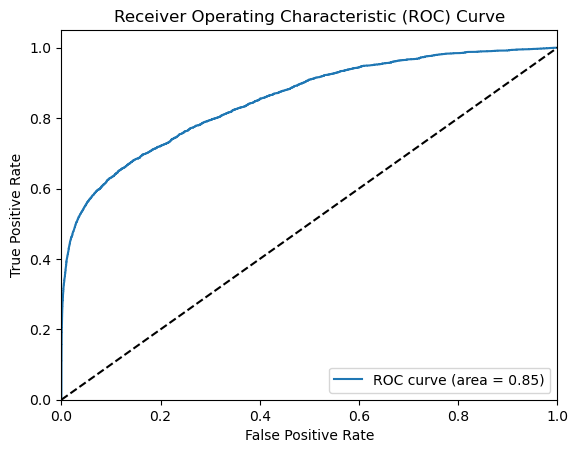

In [94]:
from sklearn.metrics import roc_curve, auc

# predict probabilities for the positive class
probs = lgbm_best.predict_proba(X_test_clean)[:, 1]

# calculate fpr and tpr for various thresholds
fpr, tpr, thresholds = roc_curve(y_test, probs)

# calculate AUC
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
#plt.savefig('roc_auc.png')
plt.show()

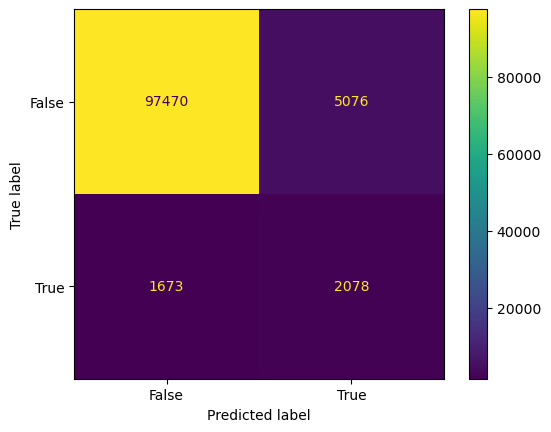

In [95]:
ConfusionMatrixDisplay.from_predictions(y_test, lgb_best_pred, display_labels = [False, True])
plt.show()

In [96]:
print(f"Training Data Score: {lgbm_best.score(X_sm_clean, y_sm)}")
print(f"Validating Data Score: {lgbm_best.score(X_valid_clean, y_valid)}")
print(f"Testing Data Score: {lgbm_best.score(X_test_clean, y_test)}")

Training Data Score: 0.9708860632583647
Validating Data Score: 0.9535031397728074
Testing Data Score: 0.9365080858349718


In [98]:
# Get the feature importances
feature_importance = lgbm_best.feature_importances_

# Create a dataframe to store the feature importance
importance_df = pd.DataFrame({"Feature": X_sm_clean.columns, "Importance": feature_importance})

# Sort the dataframe by importance values in descending order
importance_df = importance_df.sort_values(by="Importance", ascending=False)

# Print the feature importance
print(importance_df)

                            Feature  Importance
0                                C1         129
5                               C14         117
102                  TransactionAmt          98
285                           card1          81
4                               C13          73
286                           card2          61
163                            V280          58
161                            V279          52
19                               D3          45
283                           addr1          45
10                               C6          42
6                                C2          41
178                            V294          40
2                               C11          39
168                            V285          36
8                                C4          36
293                           card5          34
296                     card6_debit          34
269                             V87          32
33                         M4_empty     

In [103]:
#Save Model
lgbm_cv_model = 'lgbm_cv_model.pkl'
with open(lgbm_cv_model, 'wb') as file:
    pickle.dump(lgbm_best, file)